In [1]:
import tensorflow as tf
import os
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2
from tensorflow.keras import layers
from keras.models import Model, Sequential
from tensorflow.keras.applications import VGG19
from keras.layers import Dense, Conv2D, Flatten, BatchNormalization, LeakyReLU
from keras.layers import Conv2DTranspose, Dropout, ReLU, Input, Concatenate, ZeroPadding2D
from keras.optimizers import Adam
from keras.utils import plot_model
# from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow_addons as tfa

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [2]:
import tensorflow as tf

physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) == 0:
    print("No GPU devices found. Make sure your GPU is properly installed and configured.")
else:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU configured successfully.")

GPU configured successfully.


In [3]:
import tensorflow as tf

# Check available GPUs
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only allocate GPU memory growth
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        print("GPU memory growth set to True")
    except RuntimeError as e:
        print(e)

GPU memory growth set to True


In [4]:
import tensorflow as tf

# Check if TensorFlow can access GPU
num_gpus = len(tf.config.experimental.list_physical_devices('GPU'))

if num_gpus > 0:
    print("Num GPUs Available: ", num_gpus)
    print("TensorFlow is using GPU.")
else:
    print("No GPU available. TensorFlow is using CPU.")

Num GPUs Available:  1
TensorFlow is using GPU.


In [5]:
def load(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image,tf.float32)
    return image

In [6]:
path = "/kaggle/input/imagenet/imagenet/"
x = load(os.path.join(path, 'train/ILSVRC2012_val_00005002.JPEG'))
print(x.shape)

(409, 500, 3)


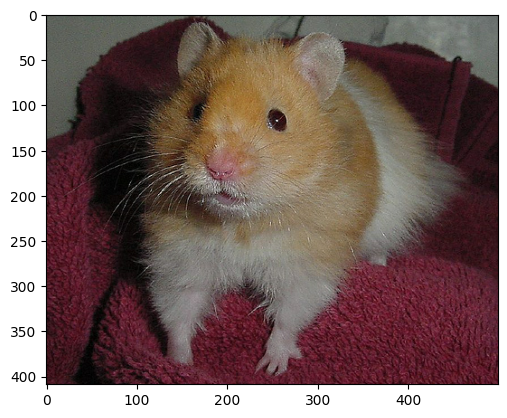

In [7]:
plt.imshow(x/255.0)

In [8]:
def normalize(real_image):
    real_image = (real_image / 255)
    return real_image

In [9]:
def random_crop(real_image):
    cropped_image = tf.image.random_crop(real_image, size = [256, 256, 3])
    return cropped_image

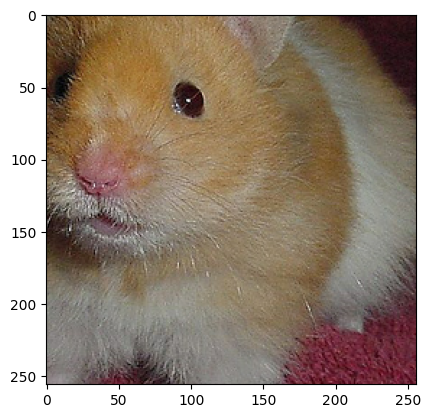

In [10]:
x_aug = random_crop(x)
plt.imshow(x_aug/255.0)

In [11]:
def resize(real_image):
    real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    return real_image

In [12]:
def rotate_image(image, angles, interpolation='BILINEAR'):
    """
    Rotate an image tensor by specified angles.

    Args:
    - image: Input image tensor with shape (batch_size, height, width, channels).
    - angles: Tensor of rotation angles in radians for each image in the batch.
    - interpolation: Interpolation method ('BILINEAR' or 'NEAREST').

    Returns:
    - Rotated image tensor.
    """
    batch_size, height, width, channels = tf.unstack(tf.shape(image))

    # Coordinates of the center of the image
    center_x = tf.cast(width, tf.float32) / 2.0
    center_y = tf.cast(height, tf.float32) / 2.0

    # Define transformation matrix
    rotation_matrix = tf.reshape(tf.stack([tf.cos(angles), -tf.sin(angles), center_x * (1 - tf.cos(angles)) + center_y * tf.sin(angles),
                                           tf.sin(angles), tf.cos(angles), -center_x * tf.sin(angles) + center_y * (1 - tf.cos(angles)),
                                           0.0, 0.0, 1.0], axis=1), shape=(-1, 3, 3))

    # Apply rotation to each pixel
    rotated_image = tfa.image.transform(image, rotation_matrix, interpolation)

    return rotated_image


In [13]:
def random_jitter(real_image):
    if tf.random.uniform(()) > 0.5:
        real_image = tf.image.flip_left_right(real_image)
    return real_image

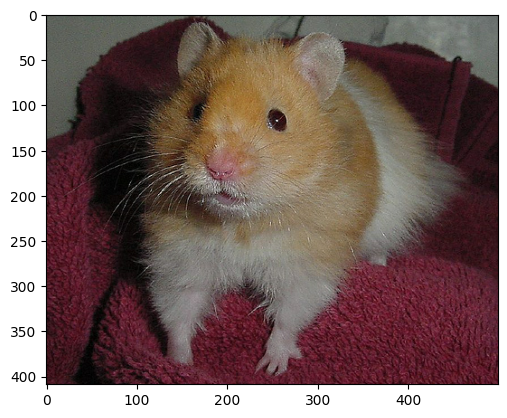

In [14]:
x_jitter = random_jitter(x)
plt.imshow(x_jitter/255.0)

In [15]:
def resize_with_aspect_ratio(image, constant_size):
        # Get image dimensions
        height, width = tf.shape(image)[0], tf.shape(image)[1]

        # Calculate aspect ratio
        aspect_ratio = tf.cast(width, tf.float32) / tf.cast(height, tf.float32)

        # Determine new dimensions based on constant size
        new_height = tf.cond(aspect_ratio >= 1.0,
                             lambda: constant_size,
                             lambda: tf.cast(constant_size / aspect_ratio, tf.int32))
        new_width = tf.cond(aspect_ratio >= 1.0,
                            lambda: tf.cast(constant_size * aspect_ratio, tf.int32),
                            lambda: constant_size)

        # Resize the image
        resized_image = tf.image.resize(image, [new_height, new_width])

        return resized_image

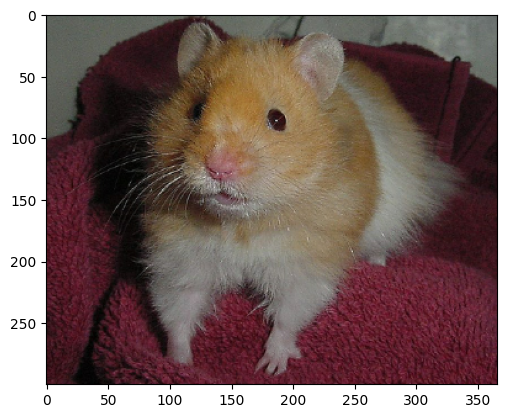

In [16]:
plt.imshow(resize_with_aspect_ratio(x,300)/255)

In [17]:
def load_train_images(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 300)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    # Define the rotation angle in radians
    rotation_angle = tf.constant(20.0 * (3.141592653589793 / 180.0), dtype=tf.float32)

    # Apply the rotation using tfa.image.rotate
    real_image = tfa.image.rotate(real_image, angles=rotation_angle)

#     # Example usage
#     angles = tf.placeholder(dtype=tf.float32, shape=(None,))
#     # Specify the rotation range in degrees
#     rotation_range = 15  # Adjust this value as needed
#     # Convert the rotation range to radians
#     rotation_range_rad = rotation_range * (np.pi / 180.0)
#     # Generate random rotation angles for each image in the batch
#     random_angles = tf.random.uniform(shape=(tf.shape(image)[0],), minval=-rotation_range_rad, maxval=rotation_range_rad)
#     # Apply custom rotation to the image with bilinear interpolation
#     real_image = rotate_image(real_image, random_angles, interpolation='BILINEAR')
    #     real_image = rotate(real_image)
    real_image = random_jitter(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [18]:
def load_test_image(image_path):
    real_image = load(image_path)
    real_image = resize_with_aspect_ratio(real_image, 256)
#     real_image = tf.image.resize(real_image, [256, 256], method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
#     real_image = tf.image.random_brightness(real_image, 0.2)
    real_image = random_crop(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:]  # AB channels
    #here L_channel becomes input i.e light/luminance of pixel and AB_channels become target
    return Y_channel, UV_channels

In [19]:
IMAGE_SIZE = 256
BATCH_SIZE = 16

In [20]:
# create input pipeline
train_dataset = tf.data.Dataset.list_files(path + "train/*.JPEG")
train_dataset = train_dataset.map(load_train_images)
train_dataset = train_dataset.take(8000)
train_dataset = train_dataset.shuffle(10).batch(BATCH_SIZE)
train_dataset.cardinality().numpy()

500

In [21]:
# create input pipeline
val = tf.data.Dataset.list_files(path + "val/*.JPEG")
val = val.map(load_test_image)
val = val.take(1000)
val = val.shuffle(10).batch(BATCH_SIZE)
val.cardinality().numpy()

63

In [22]:
# test_dataset = tf.data.Dataset.list_files(path + 'test/*.jpg')
# test_dataset = test_dataset.map(load_test_image)
# test_dataset = test_dataset.batch(1)
# test_dataset

In [23]:
# downsample block
def downsample(filters, size,dropout=False, batchnorm = True):
    init = tf.random_normal_initializer(0.,0.02)
    result = Sequential()
    result.add(Conv2D(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    if batchnorm == True:
        result.add(BatchNormalization())
    if dropout == True :
        result.add(Dropout(0.3))
    result.add(LeakyReLU())
    return result
down_model = downsample(3,4)
down_result = down_model(tf.expand_dims(x, axis = 0))
print(down_result.shape)

(1, 205, 250, 3)


In [24]:
# upsample block
def upsample(filters, size, dropout = False):
    init = tf.random_normal_initializer(0, 0.02)
    result = Sequential()
    result.add(Conv2DTranspose(filters, size, strides = 2, padding = "same", kernel_initializer = init, use_bias = False))
    result.add(BatchNormalization())
    if dropout == True:
        result.add(Dropout(0.3))
    result.add(ReLU())
    return result
up_model = upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 410, 500, 3)


In [25]:
def generator(input_shape = (256,256,1), output_channels = 2):
    inputs = Input(shape = input_shape)
    down_stack = [
        downsample(32, 4, batchnorm=False),
        downsample(64, 4),
        downsample(128, 4),
        downsample(256, 4, dropout = True),
        downsample(512, 4, dropout = True)
    ]


    up_stack = [
        upsample(512, 4, dropout=True),
        upsample(256, 4, dropout=True),
        upsample(128, 4, dropout=True),
        upsample(64, 4),
        upsample(32, 4),
    ]
    init = tf.random_normal_initializer(0., 0.02)
    last = Conv2DTranspose(2, 4, strides = 2, padding = "same", kernel_initializer = init, activation ="tanh")
    x = inputs
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)
    skips = reversed(skips[:-1])

    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = Concatenate()([x, skip])

    x = last(x)
    return Model(inputs = inputs, outputs = x)

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 sequential_2 (Sequential)   (None, 128, 128, 32)         512       ['input_1[0][0]']             
                                                                                                  
 sequential_3 (Sequential)   (None, 64, 64, 64)           33024     ['sequential_2[0][0]']        
                                                                                                  
 sequential_4 (Sequential)   (None, 32, 32, 128)          131584    ['sequential_3[0][0]']        
                                                                                              

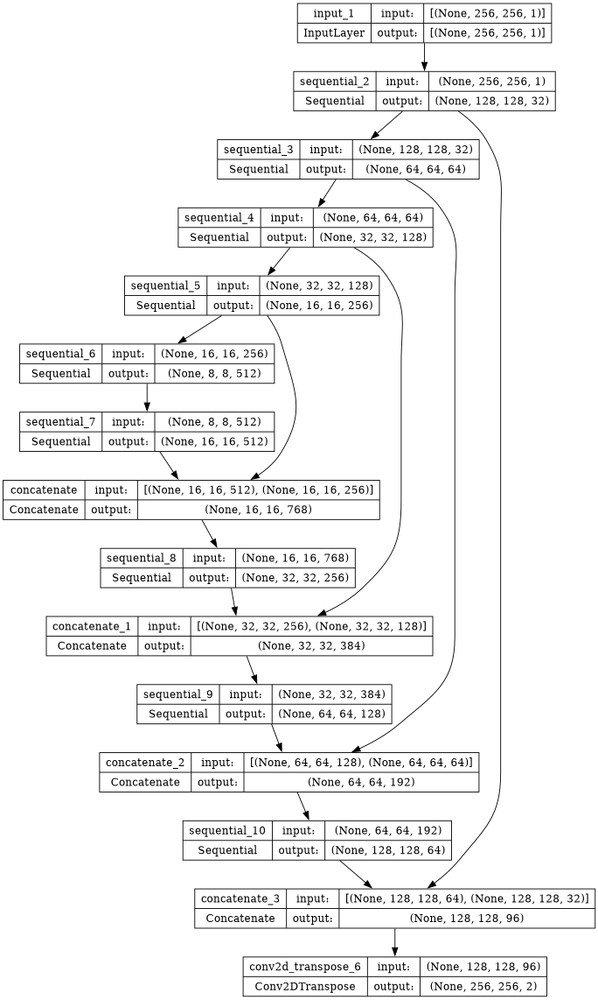

In [26]:
gen = generator()
gen.summary()
plot_model(gen, show_shapes=True, dpi = 64)

In [27]:
gen.load_weights('/kaggle/input/feb28-imagenet/modelsFeb7/gen_weight.keras')

In [28]:
def discriminator():
    init = tf.random_normal_initializer(0., 0.02)

    inp = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 1], name = "input_image")
    tar = Input(shape = [IMAGE_SIZE, IMAGE_SIZE, 2], name = "target_image")
    x = Concatenate()([inp, tar])
    down1 = downsample(64,4,False)(x)
    down2 = downsample(128, 4)(down1)
    down3 = downsample(256, 4)(down2)

    zero_pad1 = ZeroPadding2D()(down3)
    conv = Conv2D(256, 4, strides = 1, kernel_initializer = init, use_bias = False)(zero_pad1)
    leaky_relu = LeakyReLU()(conv)
    zero_pad2 = ZeroPadding2D()(leaky_relu)
    last = Conv2D(1, 4, strides = 1, kernel_initializer=init)(zero_pad2)
    return Model(inputs = [inp, tar], outputs = last)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_image (InputLayer)    [(None, 256, 256, 1)]        0         []                            
                                                                                                  
 target_image (InputLayer)   [(None, 256, 256, 2)]        0         []                            
                                                                                                  
 concatenate_4 (Concatenate  (None, 256, 256, 3)          0         ['input_image[0][0]',         
 )                                                                   'target_image[0][0]']        
                                                                                                  
 sequential_12 (Sequential)  (None, 128, 128, 64)         3328      ['concatenate_4[0][0]'] 

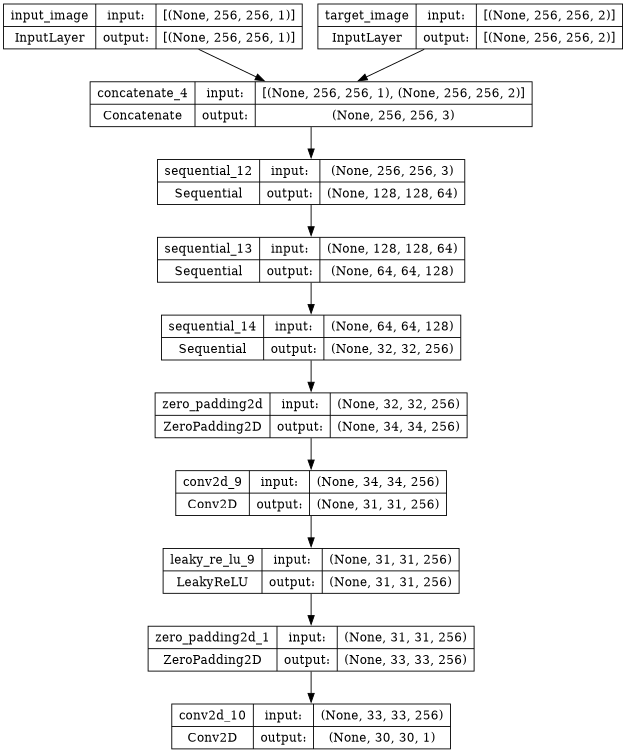

In [29]:
disc = discriminator()
disc.summary()
plot_model(disc, show_shapes=True, dpi = 64)

In [30]:
disc.load_weights('/kaggle/input/feb28-imagenet/modelsFeb7/disc_wweight.keras')

In [31]:
# Function to create YUV image from Y, U, and V channels and then convert to rgb
def create_rgb_image(y_channel, uv_channel):
    # Assuming YUV format where Y, U, and V channels are separate
    # y_channel = np.array(y_channel)
    # uv_channel = np.array(uv_channel)
    u_channel, v_channel = tf.split(uv_channel, num_or_size_splits=2, axis=-1)

    # Combine Y, U, and V channels into a YUV image
    rgb_image = tf.image.yuv_to_rgb(tf.concat([y_channel, u_channel, v_channel], axis=-1))
    return rgb_image


In [32]:
LAMBDA = 150

In [33]:
# Define the perceptual loss function
def perceptual_loss(y_true, y_pred):
    vgg = VGG19(include_top=False, weights='imagenet', input_shape=(None, None, 3))
    vgg.trainable = False
    for layer in vgg.layers:
        layer.trainable = False
    model = Model(inputs=vgg.input, outputs=vgg.get_layer('block5_conv4').output)
    model.trainable = False

    y_true_features = model(y_true)
    y_pred_features = model(y_pred)

    return tf.reduce_mean(tf.square(y_true_features - y_pred_features))

In [34]:
def generator_loss(disc_generated_output,input_, gen_output, target):
    gan_loss = loss_function(tf.ones_like(disc_generated_output), disc_generated_output)
    l1_loss = tf.reduce_mean(tf.abs(target - gen_output))
    p_loss = perceptual_loss(create_rgb_image(input_, gen_output), create_rgb_image(input_, target))
    total_gen_loss = gan_loss + (LAMBDA * l1_loss) + 150*p_loss
    return total_gen_loss, gan_loss, l1_loss, p_loss

In [35]:
from keras.losses import BinaryCrossentropy
loss_function = BinaryCrossentropy(from_logits=True)

In [36]:
def discriminator_loss(disc_real_output, disc_generated_output):
    real_loss = loss_function(tf.ones_like(disc_real_output), disc_real_output)
    generated_loss = loss_function(tf.zeros_like(disc_generated_output), disc_generated_output)
    total_disc_loss = real_loss + generated_loss
    return total_disc_loss, real_loss, generated_loss

In [37]:
generator_optimizer = Adam(lr= 2e-4, beta_1=0.5)
discriminator_optimizer = Adam(lr = 2e-4, beta_1=0.5)

In [38]:
epochs = 250

In [39]:
# import tensorflow as tf
# from tensorflow.keras.applications import VGG19
# from tensorflow.keras.models import Model

# # Load the VGG19 model
# vgg = VGG19(weights='imagenet', include_top=False)

# # Select the layers you want to use for the LPIPS score
# selected_layers = ['block1_conv1', 'block2_conv1', 'block3_conv1']

# # Create a model that outputs the selected layers
# outputs = [vgg.get_layer(name).output for name in selected_layers]
# model = Model(inputs=vgg.input, outputs=outputs)

# # Make sure the VGG model is not trainable
# model.trainable = False

# def lpips_score(image1, image2):
#     # Get the features for both images
#     image1_features = model(image1)
#     image2_features = model(image2)

#     # Initialize the score
#     score = 0

#     # For each feature layer...
#     for f1, f2 in zip(image1_features, image2_features):
#         # ... compute the mean squared error between the features
#         mse = tf.reduce_mean((f1 - f2)**2)
#         # ... and add it to the score
#         score += mse

#     return score

In [40]:
# from tensorflow.keras.applications.inception_v3 import InceptionV3
# from scipy.linalg import sqrtm

# # Load the pre-trained InceptionV3 model (weights will be downloaded if not present)
# pretrained_model = InceptionV3(weights='imagenet', include_top=True, pooling='avg')

# # Optionally, you can freeze the layers to prevent training
# for layer in pretrained_model.layers:
#     layer.trainable = False


# # Create a new model to extract features from an intermediate layer
# inception_model = tf.keras.Model(inputs=pretrained_model.input, outputs=pretrained_model.get_layer('avg_pool').input)
# def calculate_fid_score(images1, images2, inception_model):
#     # Ensure the batch dimension is removed for individual image predictions
#     images1 = np.squeeze(images1, axis=0)
#     images2 = np.squeeze(images2, axis=0)
    
#     # Resize images to the required size for the Inception model
#     images1 = tf.image.resize(images1, size=(299, 299))
#     images2 = tf.image.resize(images2, size=(299, 299))
    
#     # Extract features using the Inception model
#     features1 = inception_model.predict(np.expand_dims(images1, axis=0))
#     features2 = inception_model.predict(np.expand_dims(images2, axis=0))

#     # Remove batch dimension from features
#     features1 = np.squeeze(features1, axis=0)
#     features2 = np.squeeze(features2, axis=0)
#     #print(features1.shape)
#     # Calculate mean and covariance of feature representations
#     mean1 = np.mean(features1, axis=(0, 1, 2))
#     mean2 = np.mean(features2, axis=(0, 1, 2))
#     #print(features1.shape)
#     cov1 = np.cov(features1.transpose(2, 0, 1).reshape(features1.shape[-1], -1), rowvar=False)
#     cov2 = np.cov(features2.transpose(2, 0, 1).reshape(features2.shape[-1], -1), rowvar=False)
#     #print(cov2.shape)

#     # Calculate the squared Euclidean distance between means
#     sum_squared_diff = np.sum((mean1 - mean2)**2)

#     # Calculate the trace of the product of covariances
#     cov_sqrt = sqrtm(np.dot(cov1, cov2))
#     trace_cov_product = np.trace(cov1 + cov2 - 2 * cov_sqrt)

#     # Calculate FID score
#     fid_score = np.real(sum_squared_diff + trace_cov_product)
    
#     return fid_score

In [41]:
@tf.function
def train_step(input_image, target, epoch, training_discriminator):
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        gen_output = gen(input_image, training=True)
        disc_real_output = disc([input_image, target], training=True)
        disc_generated_output = disc([input_image, gen_output], training=True)
        gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
        disc_loss, disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
        rgb_target = create_rgb_image(input_image, target)
        rgb_generated = create_rgb_image(input_image, gen_output)
        ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
        psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#         lpips_values = lpips_score(rgb_target, rgb_generated)

        if epoch > 8:
            if training_discriminator:
                discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
                discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))
            else:
                generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
                generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
        else:
            generator_gradients = gen_tape.gradient(gen_total_loss, gen.trainable_variables)
            discriminator_gradients = disc_tape.gradient(disc_loss, disc.trainable_variables)
            generator_optimizer.apply_gradients(zip(generator_gradients, gen.trainable_variables))
            discriminator_optimizer.apply_gradients(zip(discriminator_gradients, disc.trainable_variables))

        return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, tf.constant([0])

In [42]:
@tf.function
def validation_step(input_image, target):
    # Generate output using the generator
    gen_output = gen(input_image)

    # Calculate losses without updating gradients
    disc_real_output = disc([input_image, target])
    disc_generated_output = disc([input_image, gen_output])

    gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
    disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
    rgb_target = create_rgb_image(input_image, target)
    rgb_generated = create_rgb_image(input_image, gen_output)
    ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
    psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
    #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
    return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values,psnr_values, tf.constant([0])

In [43]:
# @tf.function
# def test_step(input_image, target):
#     # Generate output using the generator
#     gen_output = gen(input_image)

#     # Calculate losses without updating gradients
#     disc_real_output = disc([input_image, target])
#     disc_generated_output = disc([input_image, gen_output])

#     gen_total_loss, gen_gan_loss, gen_l1_loss, gen_p_loss = generator_loss(disc_generated_output,input_image, gen_output, target)
#     disc_loss,disc_real_loss, disc_generated_loss = discriminator_loss(disc_real_output, disc_generated_output)
#     rgb_target = create_rgb_image(input_image, target)
#     rgb_generated = create_rgb_image(input_image, gen_output)
#     ssim_values = tf.image.ssim(rgb_target, rgb_generated, max_val=1.0)
#     psnr_values = tf.image.psnr(rgb_target, rgb_generated, max_val=1.0)
#     lpips_values = lpips_score(rgb_target, rgb_generated)
#     fid_values = calculate_fid_score(rgb_target, rgb_generated, inception_model)
#     #accuracy = calculate_accuracy(disc_generated_output, disc_real_output)
#     return gen_total_loss, gen_gan_loss, gen_l1_loss,gen_p_loss, disc_loss,disc_real_loss, disc_generated_loss, ssim_values, psnr_values, lpips_values, fid_values


In [44]:
os.mkdir('/kaggle/working/gen_output/')

In [45]:
def display_one_random_test_image(input_, target, gen_model, epoch):
    print("Displaying one random test image...")
    img_array = np.array(input_)
    generated_output_test = gen_model(input_)
    ssim = tf.image.ssim(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)
    psnr = tf.image.psnr(tf.reshape(create_rgb_image(input_, target), (256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (256,256,3)), max_val=1.0)  
#     lpips = lpips_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)))
#     p_loss = perceptual_loss(create_rgb_image(input_, target), create_rgb_image(input_, generated_output_test))
#     fid_score = calculate_fid_score(tf.reshape(create_rgb_image(input_, target), (1,256,256,3)), tf.reshape(create_rgb_image(input_,generated_output_test), (1,256,256,3)), inception_model)
    # print(input_.shape)
    input_ = np.squeeze(input_, axis=0)
    # print(type(input_), type(target))
    # print(input_.shape, input_)
    # input_.reshape((256,256))
    plt.figure(figsize=(16, 16))
    plt.subplot(1, 4, 1)
    plt.title('Input Testing Image')
    plt.imshow(input_, cmap='gray', vmax = 1, vmin = 0)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # print(target.shape)
    target = np.squeeze(target, axis=0)
    # # print(target.shape)
    target_img = create_rgb_image(input_, target).numpy()
    # # print(type(target_img))
    # target
    # # print(target_img.shape, target_img)
    plt.subplot(1, 4, 2)
    plt.title('Target Testing Image')
    plt.imshow(target_img)  # Assuming images are normalized to [0, 1]
    plt.axis('off')
    # # Convert PIL Image to NumPy array
    # img_array = np.array(input_)
    # # Add batch dimension
    # # print(img_array.shape)
    # img_array = np.expand_dims(img_array, axis=0)
    # # print(img_array.shape)
    # generated_output_test = gen_model(img_array)
    # # print(generated_output_test.shape)
    # # Squeeze the singleton dimension
    generated_output_test = np.squeeze(generated_output_test, axis=0)
    # # print(generated_output_test.shape)
    generated_img = create_rgb_image(input_, generated_output_test).numpy()
    # # print(generated_img.shape, generated_img)
    plt.subplot(1, 4, 3)
    plt.title(f'Generated Output -- epoch {epoch}')
    plt.imshow(generated_img)  # Assuming images are normalized to [-1, 1]
    plt.axis('off')
    plt.savefig(f'/kaggle/working/gen_output/epoch_{epoch}.png')
    plt.show()
    print('SSIM Score: {}'.format(ssim))
    print('PSNR Score: {}'.format(psnr))
#     print('LPIPS Score: {}'.format(lpips))
#     print('Perceptual Loss: {}'.format(p_loss))
#     print('FID Score: {}'.format(fid_score))

In [46]:
def display_random_test_image(gen_model, image_path, epoch):
    
    real_image = load(image_path)
    real_image = resize(real_image)
    real_image = normalize(real_image)
    yuv_image = tf.image.rgb_to_yuv(real_image)
    # Separate LAB into L and AB components
    Y_channel = tf.expand_dims(yuv_image[:, :, 0], axis=-1)  # L channel
    UV_channels = yuv_image[:, :, 1:] 

    # Display the image
    display_one_random_test_image(tf.reshape(Y_channel, (1,256,256,1)),tf.reshape(UV_channels,(1,256,256,2)), gen_model, epoch)


Displaying one random test image...


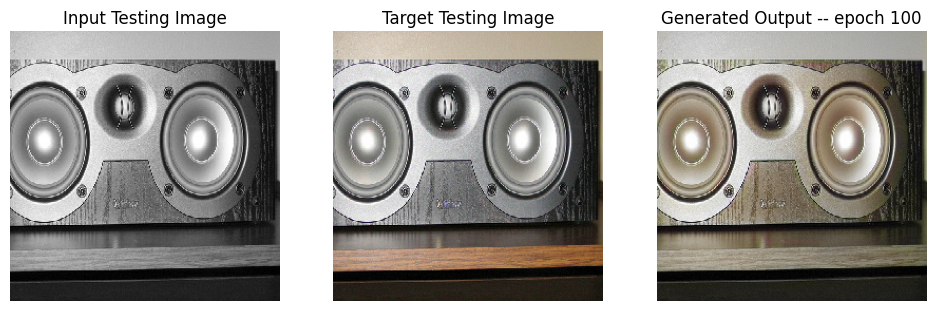

SSIM Score: 0.9498648047447205
PSNR Score: 26.710371017456055


In [47]:
display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000109.JPEG',100)

In [48]:
import random

each_epoch_train_generator_losses = []
each_epoch_train_generator_gan_losses = []
each_epoch_train_generator_l1_losses = []
each_epoch_train_generator_l2_losses = []
each_epoch_train_generator_perceptual_losses = []
each_epoch_train_discriminator_losses = []
each_epoch_train_discriminator_real_losses = []
each_epoch_train_discriminator_generated_losses = []
each_epoch_train_ssim = []
each_epoch_train_psnr = []
each_epoch_train_lpips = []
each_epoch_test_lpips = []
each_epoch_test_psnr = []
each_epoch_test_ssim = []
each_epoch_test_generator_losses = []
each_epoch_test_generator_gan_losses = []
each_epoch_test_generator_l1_losses = []
each_epoch_test_generator_l2_losses = []
each_epoch_test_generator_perceptual_losses = []
each_epoch_test_discriminator_losses = []
each_epoch_test_discriminator_real_losses = []
each_epoch_test_discriminator_generated_losses = []
train_generator_losses = []
train_generator_gan_losses = []
train_generator_l1_losses = []
train_generator_l2_losses = []
train_generator_perceptual_losses = []
train_discriminator_losses = []
train_discriminator_real_losses = []
train_discriminator_generated_losses = []
test_generator_losses = []
test_generator_gan_losses = []
test_generator_l1_losses = []
test_generator_l2_losses = []
test_generator_perceptual_losses = []
test_discriminator_losses = []
test_discriminator_real_losses = []
test_discriminator_generated_losses =[]
training_ssim = []
training_psnr = []
training_lpips = []
testing_ssim = []
testing_psnr = []
testing_lpips = []
each_epoch_all_records = []
all_records = []
def fit(train_ds, epochs, test_ds, gen_model):

    # Declare global lists
    global each_epoch_train_generator_losses, each_epoch_train_generator_gan_losses, each_epoch_train_generator_l1_losses, each_epoch_train_generator_l2_losses, each_epoch_train_generator_perceptual_losses, each_epoch_train_discriminator_losses,each_epoch_train_discriminator_real_losses, each_epoch_train_discriminator_generated_losses, each_epoch_train_ssim, each_epoch_train_psnr
    global each_epoch_test_psnr, each_epoch_test_ssim, each_epoch_test_generator_losses, each_epoch_test_generator_gan_losses, each_epoch_test_generator_l1_losses, each_epoch_test_generator_l2_losses, each_epoch_test_generator_perceptual_losses, each_epoch_test_discriminator_losses, each_epoch_test_discriminator_real_losses, each_epoch_test_discriminator_generated_losses
    global train_generator_losses, train_generator_gan_losses, train_generator_l1_losses, train_generator_l2_losses, train_generator_perceptual_losses, train_discriminator_losses, train_discriminator_real_losses, train_discriminator_generated_losses, test_generator_losses, test_generator_l2_losses, test_generator_gan_losses, test_generator_l1_losses, test_generator_perceptual_losses, test_discriminator_losses, test_discriminator_real_losses, test_discriminator_generated_losses
    global training_ssim, training_psnr, testing_ssim, testing_psnr, each_epoch_all_records, all_records, LAMBDA, each_epoch_train_lpips, each_epoch_test_lpips, training_lpips, testing_lpips


    # Initialize counters and flags
    consecutive_epochs_high_loss = 0
    training_discriminator = True
    stop_training = False
    min_learning_rate = 1e-7  # Set your desired minimum learning rate
    time_start = time.time()
    
    for ep in range(epochs):
        epoch = ep 
        start = time.time()
        train_count = 0
        test_count = 0

        print(f"Epoch {epoch}")

        for n, (input_, target) in train_ds.enumerate():
            if epoch > 10:
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss,train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips = train_step(input_, target, epoch, training_discriminator=training_discriminator)

            else:
                # If epoch is less than or equal to 10, train both generator and discriminator
                train_gen_loss, train_gen_gan_loss, train_gen_l1_loss, train_gen_perceptual_loss, train_disc_loss, train_disc_real_loss, train_disc_generated_loss, train_ssim, train_psnr, train_lpips  = train_step(input_, target, epoch, training_discriminator=None)

            each_epoch_train_generator_losses.append(train_gen_loss)
            each_epoch_train_generator_gan_losses.append(train_gen_gan_loss)
            each_epoch_train_generator_l1_losses.append(train_gen_l1_loss)
#             each_epoch_train_generator_l2_losses.append(train_gen_l2_loss)
            each_epoch_train_generator_perceptual_losses.append(train_gen_perceptual_loss)
            each_epoch_train_discriminator_losses.append(train_disc_loss)
            each_epoch_train_discriminator_real_losses.append(train_disc_real_loss)
            each_epoch_train_discriminator_generated_losses.append(train_disc_generated_loss)
            each_epoch_train_ssim.append(tf.reduce_mean(train_ssim.numpy()))
            each_epoch_train_psnr.append(tf.reduce_mean(train_psnr.numpy()))
            each_epoch_train_lpips.append(tf.reduce_mean(train_lpips.numpy()))
#             print(train_count)
            train_count += 1
#             print(n)
        #each_epoch_train_generator_losses = np.array(each_epoch_train_generator_losses)
        #print(each_epoch_train_discriminator_losses.shape())
        #print(each_epoch_train_generator_losses.shape())
        #print(each_epoch_train_ssim())
        print("Training Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f} perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_train_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch + 1, time.time() - start))
        print(f"Number of iteration {train_count}")

        train_generator_losses.append(np.mean(each_epoch_train_generator_losses))
        train_generator_gan_losses.append(np.mean(each_epoch_train_generator_gan_losses))
        train_generator_l1_losses.append(np.mean(each_epoch_train_generator_l1_losses))
#         train_generator_l2_losses.append(np.mean(each_epoch_train_generator_l2_losses))
        train_generator_perceptual_losses.append(np.mean(each_epoch_train_generator_perceptual_losses))
        train_discriminator_losses.append(np.mean(each_epoch_train_discriminator_losses))
        train_discriminator_real_losses.append(np.mean(each_epoch_train_discriminator_real_losses))
        train_discriminator_generated_losses.append(np.mean(each_epoch_train_discriminator_generated_losses))
        training_ssim.append(np.mean(each_epoch_train_ssim))
        training_psnr.append(np.mean(each_epoch_train_psnr))
        training_lpips.append(np.mean(each_epoch_train_lpips))

        # Test
        for n, (input_, target) in test_ds.enumerate():
            test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips = validation_step(input_, target)
            test_count += 1

            each_epoch_test_generator_losses.append(test_gen_loss)
            each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
            each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
#             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
            each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
            each_epoch_test_discriminator_losses.append(test_disc_loss)
            each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
            each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
            each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
            each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
            each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
    
        print("Validation Details")
        print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} Discriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- SSIM {:.5f} PSNR {:.5f} LPIPS {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips)))
        print("Time taken for epoch {} is {} sec".format(epoch+1, time.time() - start))
        print(f"Number of iteration {test_count}")
#         LAMBDA = LAMBDA * 1.006
        test_generator_losses.append(np.mean(each_epoch_test_generator_losses))
        test_generator_gan_losses.append(np.mean(each_epoch_test_generator_gan_losses))
        test_generator_l1_losses.append(np.mean(each_epoch_test_generator_l1_losses))
#         test_generator_l2_losses.append(np.mean(each_epoch_test_generator_l2_losses))
        test_generator_perceptual_losses.append(np.mean(each_epoch_test_generator_perceptual_losses))
        test_discriminator_losses.append(np.mean(each_epoch_test_discriminator_losses))
        test_discriminator_real_losses.append(np.mean(each_epoch_test_discriminator_real_losses))
        test_discriminator_generated_losses.append(np.mean(each_epoch_test_discriminator_generated_losses))
        testing_ssim.append(np.mean(each_epoch_test_ssim))
        testing_psnr.append(np.mean(each_epoch_test_psnr))
        testing_lpips.append(np.mean(each_epoch_test_lpips))

        each_epoch_all_records.append([np.mean(each_epoch_train_generator_losses),np.mean(each_epoch_train_generator_gan_losses), np.mean(each_epoch_train_generator_l1_losses),np.mean(each_epoch_train_generator_perceptual_losses), np.mean(each_epoch_train_discriminator_losses), np.mean(each_epoch_train_discriminator_generated_losses), np.mean(each_epoch_train_discriminator_real_losses), np.mean(each_epoch_train_ssim), np.mean(each_epoch_train_psnr), np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses),np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr)])
        all_records.append(each_epoch_all_records)
        # emptying for next epoch
        each_epoch_test_ssim = []
        each_epoch_test_generator_losses = []
        each_epoch_test_generator_gan_losses = []
        each_epoch_test_generator_l1_losses = []
#         each_epoch_test_generator_l2_losses = []
        each_epoch_test_generator_perceptual_losses = []
        each_epoch_test_discriminator_losses = []
        each_epoch_test_discriminator_real_losses = []
        each_epoch_test_discriminator_generated_losses = []
        each_epoch_test_psnr = []
        each_epoch_test_lpips = []
        each_epoch_all_records = []
        #emptyling list for next iteration
        each_epoch_train_generator_losses = []
        each_epoch_train_generator_gan_losses = []
        each_epoch_train_generator_l1_losses = []
#         each_epoch_train_generator_l2_losses = []
        each_epoch_train_generator_perceptual_losses = []
        each_epoch_train_discriminator_losses = []
        each_epoch_train_discriminator_real_losses = []
        each_epoch_train_discriminator_generated_losses = []
        each_epoch_train_ssim = []
        each_epoch_train_psnr = []
        each_epoch_train_lpips = []
        if time.time() - time_start > 41000:
            stop_training = True
        if epoch == 0 or epoch % 3 == 0:
            # Function to display one random test image
            # def display_random_test_image(images, labels, gen_model):
            #     # Randomly select an index
            #     random_test_image_idx = random.randint(0, len(images) - 1)

            #     # Extract input and target from the selected index
            #     random_test_input = images[random_test_image_idx]
            #     random_test_target = labels[random_test_image_idx]

            #     # Display the image
            #     display_one_random_test_image(random_test_input, random_test_target, gen_model)

            # Example usage
            display_random_test_image(gen, '/kaggle/input/imagenet/imagenet/val/ILSVRC2012_val_00000109.JPEG', epoch+1)
        # Check if the difference between two consecutive epochs for the last 5 epochs is less than 1
        if ep > 10:
            # Check 1f the difference between two consecutive epochs for the last S epochs is less than 1 or 0.3
            last_epochs_losses = train_discriminator_losses[-5:] if training_discriminator else train_generator_losses[-5:]
            if all(((last_epochs_losses[i] - last_epochs_losses[i - 1])) < 0.01 if training_discriminator else ((last_epochs_losses[1] - last_epochs_losses[i - 1])) < 0.05 for i in range(1, 5)):
                consecutive_epochs_high_loss += 1
            else:
                consecutive_epochs_high_loss = 0
        
        
#         LAMBDA = LAMBDA*1.003
            # If the condition is met for 4 consecutive epochs, reduce the learning rate
        if consecutive_epochs_high_loss == 4:
            if training_discriminator:
                current_lr = generator_optimizer. learning_rate.numpy()
                new_lr = max (current_lr * 0.45, min_learning_rate)
                if new_lr > min_learning_rate:
                    generator_optimizer.learning_rate.assign(new_lr)
                    print (f"Reduced generator learning rate to {new_lr} at epoch {epoch + 1}")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Generator learning rate already at the minimum. Stopping training.")
                    stop_training = True
            else:
                current_lr = discriminator_optimizer.learning_rate.numpy()
                new_lr = max (current_lr * 0.3, min_learning_rate)
                if new_lr > min_learning_rate:
                    discriminator_optimizer.learning_rate.assign(new_lr)
                    print(f"Reduced discriminator learning rate to {new_lr} at epoch {epoch + 1}.")
                    # Switch training focus
                    training_discriminator = not training_discriminator
                else:
                    print(f"Discriminator learning rate already at the minimum. Stopping training.")
                    stop_training = True

                consecutive_epochs_high_loss = 0
        # Check the flag variable
        if stop_training:
            break

In [49]:
tf.config.run_functions_eagerly(True)

Epoch 0
80134624/80134624 [==============================] - 1s 0us/step
Training Details
Generator-- total_loss:10.51828 gan_loss:1.99184 l1_loss:0.04756 perceptual_loss:0.00928 Discriminator-- total_loss:5.06593 real_loss:3.27529 generated_loss:1.79064 --- SSIM 0.87659 PSNR 22.23919 LPIPS 0.00000
Time taken for epoch 1 is 651.8007864952087 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.22069 gan_loss:0.76808 l1_loss:0.05866  perceptual_loss:0.01102 Discriminator-- total_loss:3.55397 real_loss:2.39112 generated_loss:1.16285 --- SSIM 0.87369 PSNR 20.84739 LPIPS 0.00000
Time taken for epoch 1 is 698.0648820400238 sec
Number of iteration 63
Displaying one random test image...


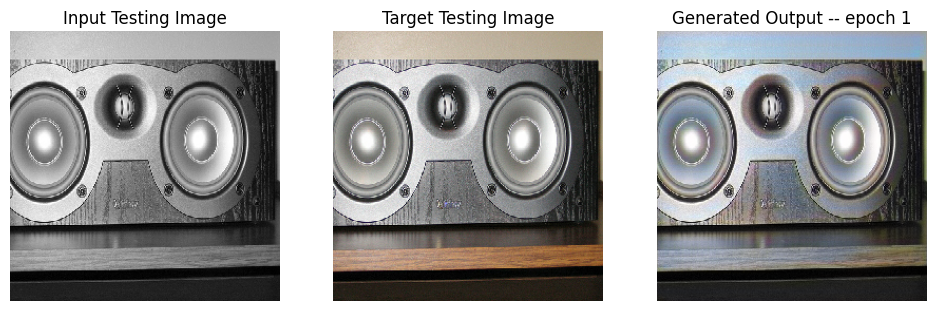

SSIM Score: 0.9337131977081299
PSNR Score: 24.442781448364258
Epoch 1
Training Details
Generator-- total_loss:10.25913 gan_loss:1.45653 l1_loss:0.04946 perceptual_loss:0.00922 Discriminator-- total_loss:1.75722 real_loss:0.83496 generated_loss:0.92226 --- SSIM 0.88569 PSNR 21.74402 LPIPS 0.00000
Time taken for epoch 2 is 640.8806025981903 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.92843 gan_loss:0.86385 l1_loss:0.06256  perceptual_loss:0.01121 Discriminator-- total_loss:2.11606 real_loss:1.19177 generated_loss:0.92429 --- SSIM 0.86506 PSNR 20.52183 LPIPS 0.00000
Time taken for epoch 2 is 685.5098919868469 sec
Number of iteration 63
Epoch 2
Training Details
Generator-- total_loss:10.19116 gan_loss:1.27280 l1_loss:0.05026 perceptual_loss:0.00920 Discriminator-- total_loss:1.47086 real_loss:0.71576 generated_loss:0.75510 --- SSIM 0.88592 PSNR 21.60385 LPIPS 0.00000
Time taken for epoch 3 is 641.9533212184906 sec
Number of iteration 500
Validation Details
Gene

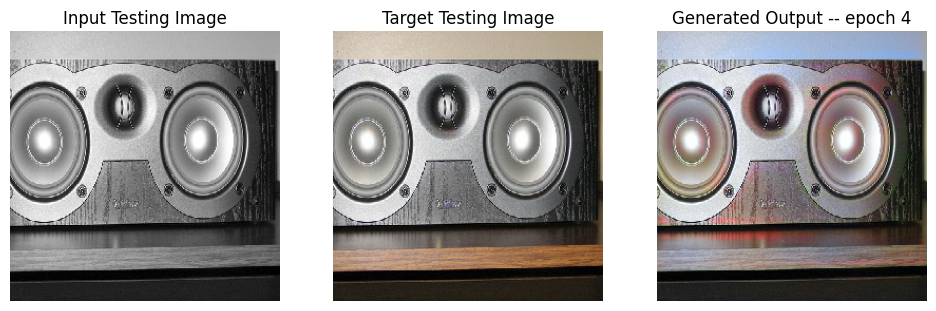

SSIM Score: 0.9357621073722839
PSNR Score: 24.01913833618164
Epoch 4
Training Details
Generator-- total_loss:10.32057 gan_loss:1.22034 l1_loss:0.05127 perceptual_loss:0.00940 Discriminator-- total_loss:1.28553 real_loss:0.60315 generated_loss:0.68239 --- SSIM 0.88356 PSNR 21.45117 LPIPS 0.00000
Time taken for epoch 5 is 643.5589201450348 sec
Number of iteration 500
Validation Details
Generator-- total_loss:12.01349 gan_loss:0.61800 l1_loss:0.06478  perceptual_loss:0.01119 Discriminator-- total_loss:1.98170 real_loss:0.99594 generated_loss:0.98576 --- SSIM 0.85467 PSNR 19.62527 LPIPS 0.00000
Time taken for epoch 5 is 687.2685680389404 sec
Number of iteration 63
Epoch 5
Training Details
Generator-- total_loss:10.01945 gan_loss:1.19696 l1_loss:0.04968 perceptual_loss:0.00913 Discriminator-- total_loss:1.25262 real_loss:0.58943 generated_loss:0.66319 --- SSIM 0.88871 PSNR 21.65727 LPIPS 0.00000
Time taken for epoch 6 is 649.7280125617981 sec
Number of iteration 500
Validation Details
Gener

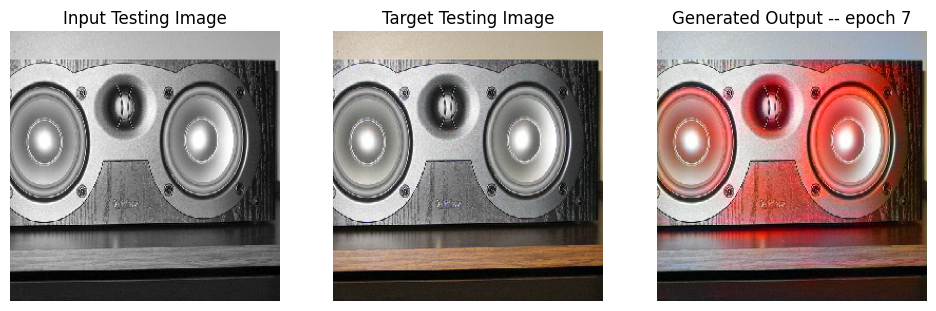

SSIM Score: 0.8652946949005127
PSNR Score: 17.5915584564209
Epoch 7
Training Details
Generator-- total_loss:10.26411 gan_loss:1.18951 l1_loss:0.05127 perceptual_loss:0.00923 Discriminator-- total_loss:1.20919 real_loss:0.56755 generated_loss:0.64164 --- SSIM 0.88258 PSNR 21.35862 LPIPS 0.00000
Time taken for epoch 8 is 642.1684033870697 sec
Number of iteration 500
Validation Details
Generator-- total_loss:11.72254 gan_loss:0.29345 l1_loss:0.06551  perceptual_loss:0.01068 Discriminator-- total_loss:2.36185 real_loss:1.87645 generated_loss:0.48540 --- SSIM 0.88631 PSNR 19.52189 LPIPS 0.00000
Time taken for epoch 8 is 685.6697261333466 sec
Number of iteration 63
Epoch 8
Training Details
Generator-- total_loss:10.27666 gan_loss:1.21778 l1_loss:0.05108 perceptual_loss:0.00931 Discriminator-- total_loss:1.18709 real_loss:0.55386 generated_loss:0.63324 --- SSIM 0.88405 PSNR 21.34792 LPIPS 0.00000
Time taken for epoch 9 is 646.0009112358093 sec
Number of iteration 500
Validation Details
Genera

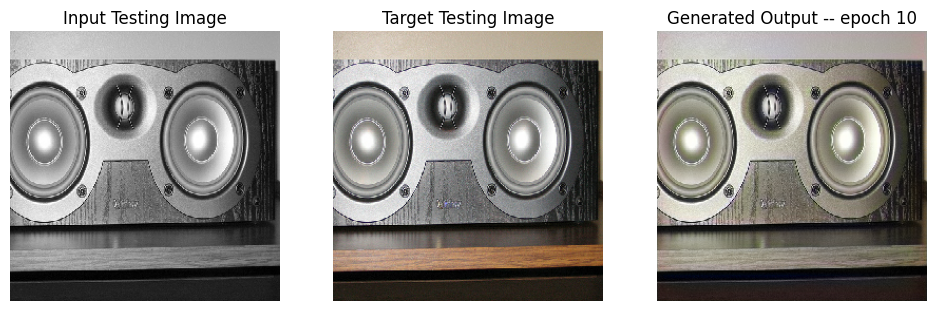

SSIM Score: 0.9460981488227844
PSNR Score: 27.717397689819336
Epoch 10
Training Details
Generator-- total_loss:8.24364 gan_loss:0.54776 l1_loss:0.04272 perceptual_loss:0.00859 Discriminator-- total_loss:1.93887 real_loss:1.31927 generated_loss:0.61960 --- SSIM 0.90729 PSNR 23.21747 LPIPS 0.00000
Time taken for epoch 11 is 588.4118971824646 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.58567 gan_loss:0.21761 l1_loss:0.04643  perceptual_loss:0.00935 Discriminator-- total_loss:3.58191 real_loss:1.87091 generated_loss:1.71101 --- SSIM 0.90720 PSNR 23.02473 LPIPS 0.00000
Time taken for epoch 11 is 631.3554995059967 sec
Number of iteration 63
Epoch 11
Training Details
Generator-- total_loss:16.68024 gan_loss:9.01785 l1_loss:0.04257 perceptual_loss:0.00851 Discriminator-- total_loss:0.01672 real_loss:0.00756 generated_loss:0.00917 --- SSIM 0.90795 PSNR 23.20612 LPIPS 0.00000
Time taken for epoch 12 is 450.13688135147095 sec
Number of iteration 500
Validation Details


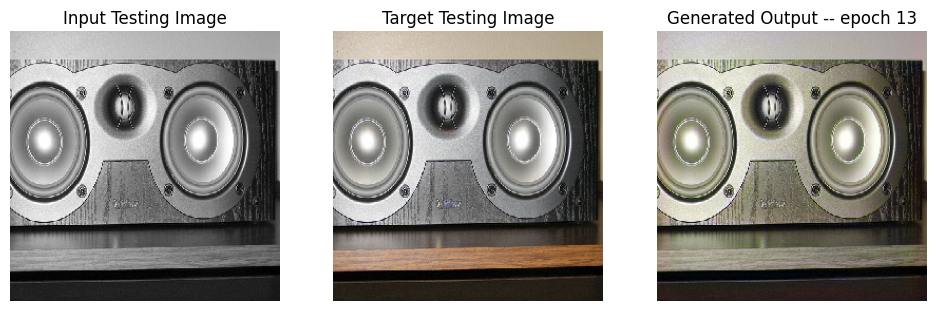

SSIM Score: 0.9442312717437744
PSNR Score: 26.98807144165039
Epoch 13
Training Details
Generator-- total_loss:19.62745 gan_loss:12.00122 l1_loss:0.04237 perceptual_loss:0.00847 Discriminator-- total_loss:0.00057 real_loss:0.00023 generated_loss:0.00034 --- SSIM 0.90822 PSNR 23.20166 LPIPS 0.00000
Time taken for epoch 14 is 449.77127861976624 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.30504 gan_loss:0.04612 l1_loss:0.04565  perceptual_loss:0.00941 Discriminator-- total_loss:5.00714 real_loss:4.81607 generated_loss:0.19107 --- SSIM 0.90670 PSNR 23.14322 LPIPS 0.00000
Time taken for epoch 14 is 493.73752522468567 sec
Number of iteration 63
Epoch 14
Training Details
Generator-- total_loss:20.34863 gan_loss:12.80774 l1_loss:0.04188 perceptual_loss:0.00839 Discriminator-- total_loss:0.00012 real_loss:0.00008 generated_loss:0.00005 --- SSIM 0.90933 PSNR 23.29318 LPIPS 0.00000
Time taken for epoch 15 is 460.3230686187744 sec
Number of iteration 500
Validation Detai

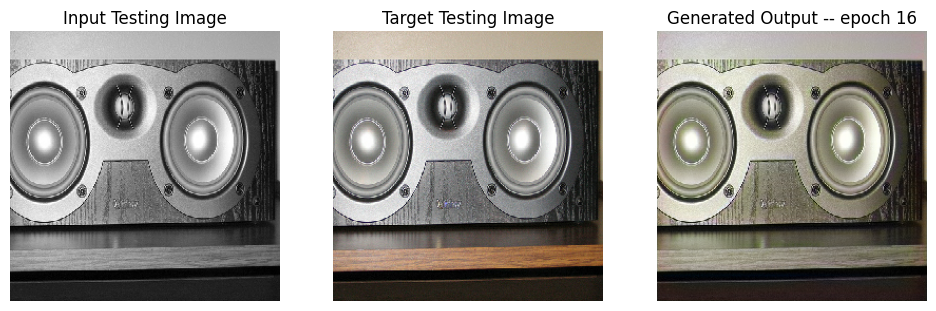

SSIM Score: 0.9441154599189758
PSNR Score: 26.987375259399414
Epoch 16
Training Details
Generator-- total_loss:21.88996 gan_loss:14.30934 l1_loss:0.04212 perceptual_loss:0.00842 Discriminator-- total_loss:0.00004 real_loss:0.00002 generated_loss:0.00002 --- SSIM 0.90836 PSNR 23.25311 LPIPS 0.00000
Time taken for epoch 17 is 423.23096323013306 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.35999 gan_loss:0.08083 l1_loss:0.04549  perceptual_loss:0.00970 Discriminator-- total_loss:4.08562 real_loss:3.91291 generated_loss:0.17271 --- SSIM 0.90893 PSNR 23.09207 LPIPS 0.00000
Time taken for epoch 17 is 466.98698711395264 sec
Number of iteration 63
Epoch 17
Training Details
Generator-- total_loss:22.68516 gan_loss:15.02521 l1_loss:0.04258 perceptual_loss:0.00849 Discriminator-- total_loss:0.00002 real_loss:0.00001 generated_loss:0.00001 --- SSIM 0.90763 PSNR 23.17457 LPIPS 0.00000
Time taken for epoch 18 is 430.3188383579254 sec
Number of iteration 500
Validation Deta

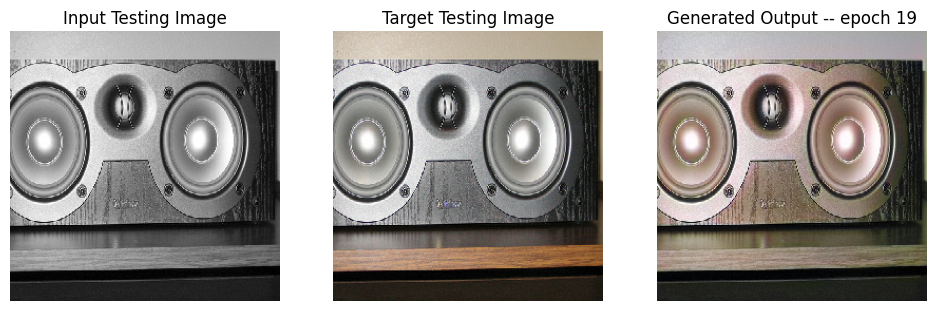

SSIM Score: 0.9459397792816162
PSNR Score: 26.13538932800293
Epoch 19
Training Details
Generator-- total_loss:7.45145 gan_loss:0.02756 l1_loss:0.04130 perceptual_loss:0.00819 Discriminator-- total_loss:10.37441 real_loss:10.37440 generated_loss:0.00001 --- SSIM 0.91462 PSNR 23.62637 LPIPS 0.00000
Time taken for epoch 20 is 564.5221419334412 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.28917 gan_loss:0.00000 l1_loss:0.04576  perceptual_loss:0.00950 Discriminator-- total_loss:18.97359 real_loss:18.97354 generated_loss:0.00004 --- SSIM 0.91353 PSNR 23.36915 LPIPS 0.00000
Time taken for epoch 20 is 608.0895974636078 sec
Number of iteration 63
Epoch 20
Training Details
Generator-- total_loss:7.49879 gan_loss:0.02177 l1_loss:0.04159 perceptual_loss:0.00825 Discriminator-- total_loss:10.43803 real_loss:10.43800 generated_loss:0.00003 --- SSIM 0.91514 PSNR 23.56732 LPIPS 0.00000
Time taken for epoch 21 is 555.9111967086792 sec
Number of iteration 500
Validation Detai

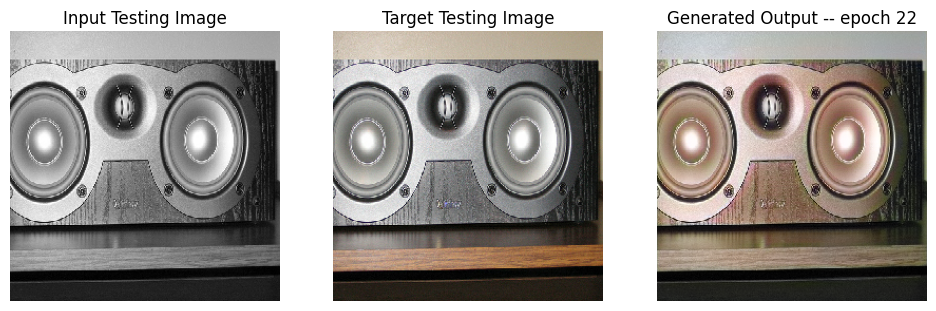

SSIM Score: 0.9427056312561035
PSNR Score: 24.85218048095703
Epoch 22
Training Details
Generator-- total_loss:7.47750 gan_loss:0.01745 l1_loss:0.04160 perceptual_loss:0.00813 Discriminator-- total_loss:10.60714 real_loss:10.60711 generated_loss:0.00004 --- SSIM 0.91554 PSNR 23.64552 LPIPS 0.00000
Time taken for epoch 23 is 556.148138999939 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.22367 gan_loss:0.00000 l1_loss:0.04548  perceptual_loss:0.00935 Discriminator-- total_loss:18.49040 real_loss:18.49028 generated_loss:0.00012 --- SSIM 0.91223 PSNR 23.09216 LPIPS 0.00000
Time taken for epoch 23 is 598.2012712955475 sec
Number of iteration 63
Epoch 23
Training Details
Generator-- total_loss:7.39750 gan_loss:0.01663 l1_loss:0.04121 perceptual_loss:0.00800 Discriminator-- total_loss:10.24444 real_loss:10.24442 generated_loss:0.00002 --- SSIM 0.91587 PSNR 23.67532 LPIPS 0.00000
Time taken for epoch 24 is 556.3187365531921 sec
Number of iteration 500
Validation Detail

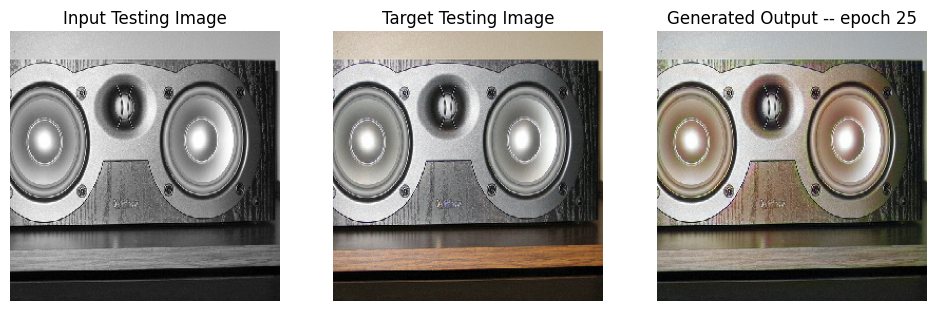

SSIM Score: 0.9439480900764465
PSNR Score: 25.610483169555664
Epoch 25
Training Details
Generator-- total_loss:7.34510 gan_loss:0.01481 l1_loss:0.04082 perceptual_loss:0.00805 Discriminator-- total_loss:10.28523 real_loss:10.28521 generated_loss:0.00002 --- SSIM 0.91511 PSNR 23.75101 LPIPS 0.00000
Time taken for epoch 26 is 553.0991413593292 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.44366 gan_loss:0.00000 l1_loss:0.04706  perceptual_loss:0.00923 Discriminator-- total_loss:18.60578 real_loss:18.60559 generated_loss:0.00020 --- SSIM 0.91282 PSNR 22.86067 LPIPS 0.00000
Time taken for epoch 26 is 596.9166741371155 sec
Number of iteration 63
Epoch 26
Training Details
Generator-- total_loss:7.39612 gan_loss:0.01480 l1_loss:0.04105 perceptual_loss:0.00816 Discriminator-- total_loss:10.10517 real_loss:10.10515 generated_loss:0.00002 --- SSIM 0.91407 PSNR 23.66222 LPIPS 0.00000
Time taken for epoch 27 is 559.7973103523254 sec
Number of iteration 500
Validation Deta

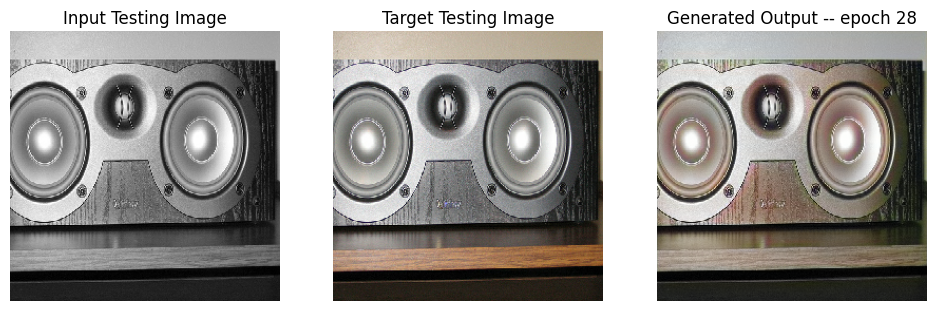

SSIM Score: 0.9472290873527527
PSNR Score: 26.795745849609375
Epoch 28
Training Details
Generator-- total_loss:7.38698 gan_loss:0.01386 l1_loss:0.04109 perceptual_loss:0.00806 Discriminator-- total_loss:10.15449 real_loss:10.15445 generated_loss:0.00004 --- SSIM 0.91392 PSNR 23.67360 LPIPS 0.00000
Time taken for epoch 29 is 550.4715411663055 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.35269 gan_loss:0.00000 l1_loss:0.04656  perceptual_loss:0.00913 Discriminator-- total_loss:17.64239 real_loss:17.64231 generated_loss:0.00007 --- SSIM 0.91336 PSNR 22.93458 LPIPS 0.00000
Time taken for epoch 29 is 591.9996063709259 sec
Number of iteration 63
Epoch 29
Training Details
Generator-- total_loss:7.37581 gan_loss:0.01470 l1_loss:0.04105 perceptual_loss:0.00802 Discriminator-- total_loss:10.14483 real_loss:10.14482 generated_loss:0.00002 --- SSIM 0.91454 PSNR 23.73313 LPIPS 0.00000
Time taken for epoch 30 is 551.2443156242371 sec
Number of iteration 500
Validation Deta

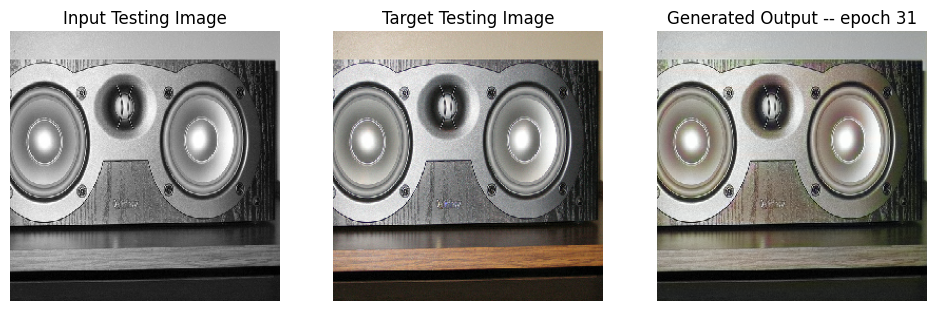

SSIM Score: 0.9495294094085693
PSNR Score: 27.353410720825195
Epoch 31
Training Details
Generator-- total_loss:7.31848 gan_loss:0.01417 l1_loss:0.04070 perceptual_loss:0.00800 Discriminator-- total_loss:10.19711 real_loss:10.19708 generated_loss:0.00003 --- SSIM 0.91516 PSNR 23.74290 LPIPS 0.00000
Time taken for epoch 32 is 547.1832542419434 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.33134 gan_loss:0.00000 l1_loss:0.04616  perceptual_loss:0.00938 Discriminator-- total_loss:18.34095 real_loss:18.34068 generated_loss:0.00028 --- SSIM 0.90934 PSNR 23.06240 LPIPS 0.00000
Time taken for epoch 32 is 588.4048068523407 sec
Number of iteration 63
Epoch 32
Training Details
Generator-- total_loss:7.45888 gan_loss:0.01412 l1_loss:0.04160 perceptual_loss:0.00803 Discriminator-- total_loss:10.06515 real_loss:10.06513 generated_loss:0.00001 --- SSIM 0.91292 PSNR 23.64282 LPIPS 0.00000
Time taken for epoch 33 is 547.2325239181519 sec
Number of iteration 500
Validation Deta

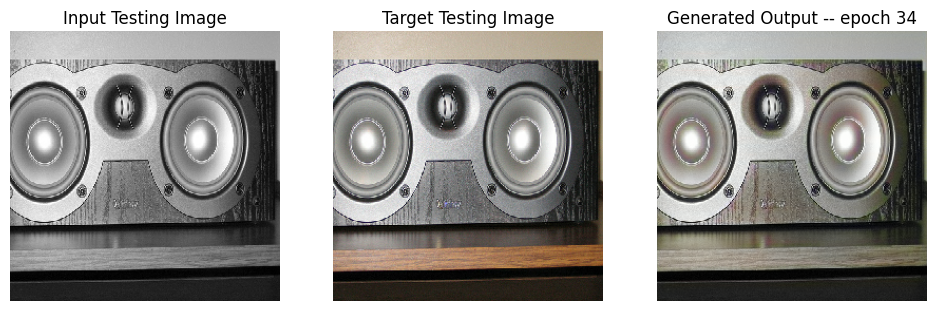

SSIM Score: 0.9507305026054382
PSNR Score: 27.892318725585938
Epoch 34
Training Details
Generator-- total_loss:7.29797 gan_loss:0.01478 l1_loss:0.04062 perceptual_loss:0.00794 Discriminator-- total_loss:9.98626 real_loss:9.98625 generated_loss:0.00002 --- SSIM 0.91514 PSNR 23.74928 LPIPS 0.00000
Time taken for epoch 35 is 548.1854777336121 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.37363 gan_loss:0.00000 l1_loss:0.04651  perceptual_loss:0.00932 Discriminator-- total_loss:17.69144 real_loss:17.69093 generated_loss:0.00050 --- SSIM 0.90980 PSNR 23.08610 LPIPS 0.00000
Time taken for epoch 35 is 589.8248507976532 sec
Number of iteration 63
Epoch 35
Training Details
Generator-- total_loss:7.32733 gan_loss:0.01395 l1_loss:0.04082 perceptual_loss:0.00793 Discriminator-- total_loss:9.85822 real_loss:9.85820 generated_loss:0.00002 --- SSIM 0.91492 PSNR 23.74512 LPIPS 0.00000
Time taken for epoch 36 is 550.7681066989899 sec
Number of iteration 500
Validation Details


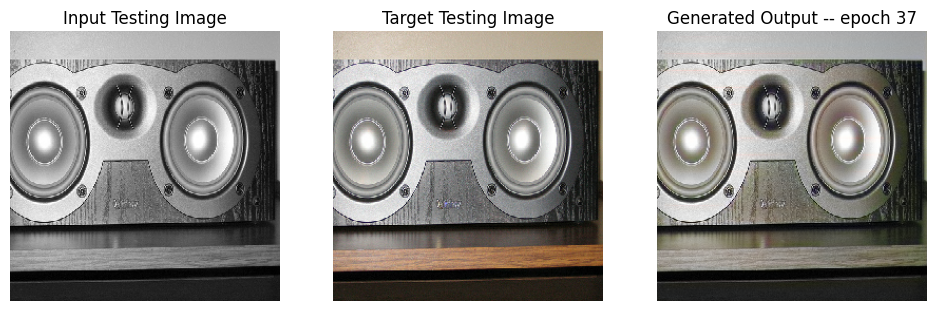

SSIM Score: 0.9492916464805603
PSNR Score: 27.65924835205078
Epoch 37
Training Details
Generator-- total_loss:7.34542 gan_loss:0.01385 l1_loss:0.04094 perceptual_loss:0.00793 Discriminator-- total_loss:9.92163 real_loss:9.92162 generated_loss:0.00001 --- SSIM 0.91434 PSNR 23.74668 LPIPS 0.00000
Time taken for epoch 38 is 546.3717396259308 sec
Number of iteration 500
Validation Details
Generator-- total_loss:7.96465 gan_loss:0.00000 l1_loss:0.04412  perceptual_loss:0.00898 Discriminator-- total_loss:18.65722 real_loss:18.65718 generated_loss:0.00004 --- SSIM 0.91306 PSNR 23.37541 LPIPS 0.00000
Time taken for epoch 38 is 587.7162535190582 sec
Number of iteration 63
Epoch 38
Training Details
Generator-- total_loss:7.35247 gan_loss:0.01366 l1_loss:0.04087 perceptual_loss:0.00805 Discriminator-- total_loss:9.95934 real_loss:9.95929 generated_loss:0.00005 --- SSIM 0.91317 PSNR 23.73950 LPIPS 0.00000
Time taken for epoch 39 is 546.5449206829071 sec
Number of iteration 500
Validation Details
G

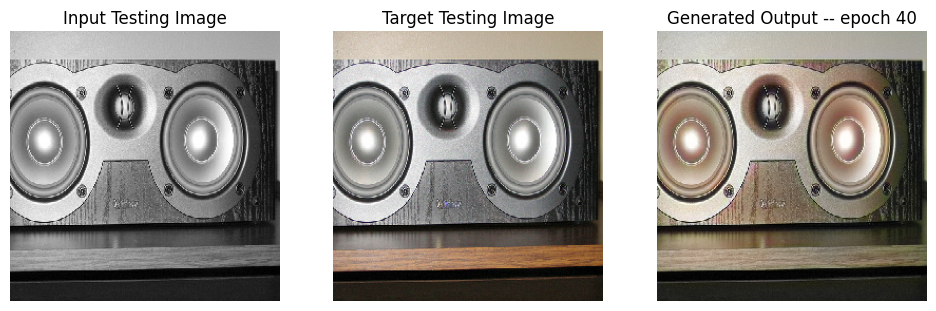

SSIM Score: 0.946256697177887
PSNR Score: 26.011444091796875
Epoch 40
Training Details
Generator-- total_loss:7.25347 gan_loss:0.01400 l1_loss:0.04034 perceptual_loss:0.00792 Discriminator-- total_loss:9.97879 real_loss:9.97876 generated_loss:0.00003 --- SSIM 0.91462 PSNR 23.80686 LPIPS 0.00000
Time taken for epoch 41 is 546.5909941196442 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.15672 gan_loss:0.00000 l1_loss:0.04482  perceptual_loss:0.00955 Discriminator-- total_loss:18.89316 real_loss:18.89289 generated_loss:0.00026 --- SSIM 0.91095 PSNR 23.37034 LPIPS 0.00000
Time taken for epoch 41 is 588.4029974937439 sec
Number of iteration 63
Reduced discriminator learning rate to 0.0003000000142492354 at epoch 41.
Epoch 41
Training Details
Generator-- total_loss:20.35160 gan_loss:13.08695 l1_loss:0.04042 perceptual_loss:0.00801 Discriminator-- total_loss:0.04502 real_loss:0.03069 generated_loss:0.01433 --- SSIM 0.91606 PSNR 23.89127 LPIPS 0.00000
Time taken for ep

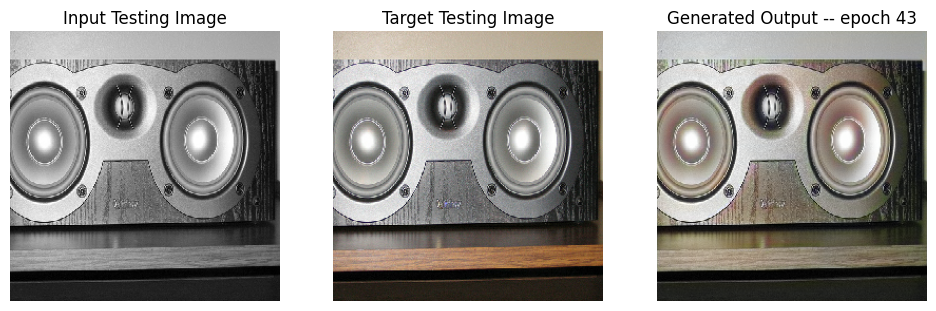

SSIM Score: 0.9490759372711182
PSNR Score: 27.377605438232422
Epoch 43
Training Details
Generator-- total_loss:23.03219 gan_loss:15.69028 l1_loss:0.04095 perceptual_loss:0.00800 Discriminator-- total_loss:0.00025 real_loss:0.00012 generated_loss:0.00013 --- SSIM 0.91518 PSNR 23.80959 LPIPS 0.00000
Time taken for epoch 44 is 418.8305461406708 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.50971 gan_loss:0.00124 l1_loss:0.04728  perceptual_loss:0.00945 Discriminator-- total_loss:9.08380 real_loss:9.07569 generated_loss:0.00810 --- SSIM 0.90788 PSNR 23.04968 LPIPS 0.00000
Time taken for epoch 44 is 460.1970000267029 sec
Number of iteration 63
Epoch 44
Training Details
Generator-- total_loss:23.84753 gan_loss:16.54699 l1_loss:0.04066 perceptual_loss:0.00801 Discriminator-- total_loss:0.00016 real_loss:0.00006 generated_loss:0.00010 --- SSIM 0.91619 PSNR 23.82465 LPIPS 0.00000
Time taken for epoch 45 is 404.81360030174255 sec
Number of iteration 500
Validation Detai

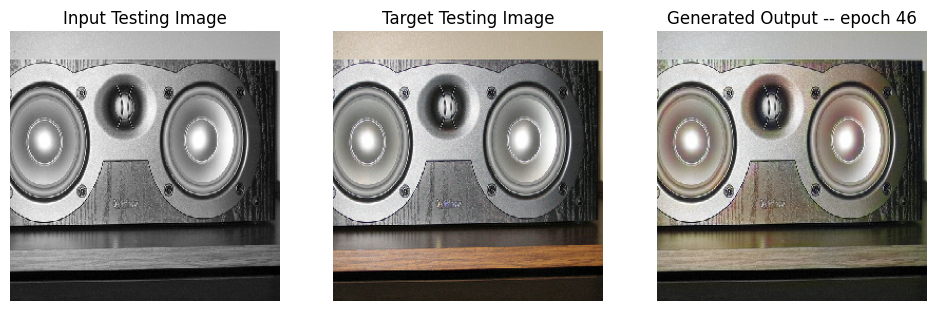

SSIM Score: 0.9490436911582947
PSNR Score: 27.355009078979492
Epoch 46
Training Details
Generator-- total_loss:24.91934 gan_loss:17.52893 l1_loss:0.04122 perceptual_loss:0.00805 Discriminator-- total_loss:0.00007 real_loss:0.00003 generated_loss:0.00004 --- SSIM 0.91564 PSNR 23.76623 LPIPS 0.00000
Time taken for epoch 47 is 405.39493203163147 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.02649 gan_loss:0.00138 l1_loss:0.04454  perceptual_loss:0.00896 Discriminator-- total_loss:9.11872 real_loss:9.11112 generated_loss:0.00760 --- SSIM 0.91438 PSNR 23.41605 LPIPS 0.00000
Time taken for epoch 47 is 447.1156554222107 sec
Number of iteration 63
Epoch 47
Training Details
Generator-- total_loss:25.44516 gan_loss:18.22643 l1_loss:0.04024 perceptual_loss:0.00789 Discriminator-- total_loss:0.00005 real_loss:0.00002 generated_loss:0.00003 --- SSIM 0.91678 PSNR 23.89230 LPIPS 0.00000
Time taken for epoch 48 is 405.72864961624146 sec
Number of iteration 500
Validation Deta

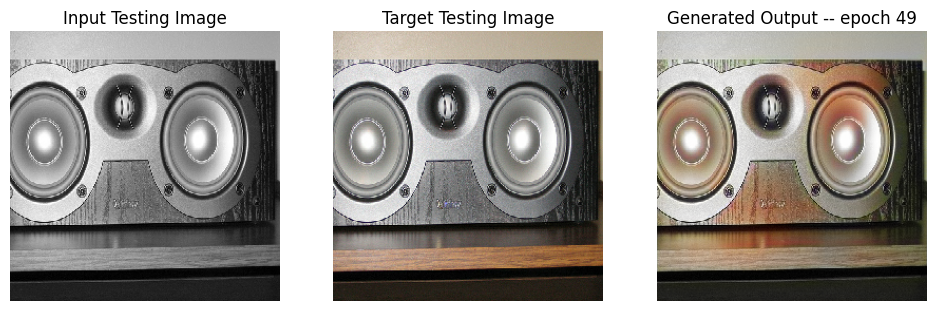

SSIM Score: 0.9389511942863464
PSNR Score: 24.31846046447754
Epoch 49
Training Details
Generator-- total_loss:7.59807 gan_loss:0.04183 l1_loss:0.04215 perceptual_loss:0.00823 Discriminator-- total_loss:6.97917 real_loss:6.97909 generated_loss:0.00008 --- SSIM 0.91290 PSNR 23.11748 LPIPS 0.00000
Time taken for epoch 50 is 547.4491620063782 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.88218 gan_loss:0.00015 l1_loss:0.05005  perceptual_loss:0.00916 Discriminator-- total_loss:12.82030 real_loss:12.82009 generated_loss:0.00021 --- SSIM 0.90674 PSNR 22.29437 LPIPS 0.00000
Time taken for epoch 50 is 589.4621994495392 sec
Number of iteration 63
Epoch 50
Training Details
Generator-- total_loss:7.54199 gan_loss:0.03991 l1_loss:0.04197 perceptual_loss:0.00805 Discriminator-- total_loss:6.69505 real_loss:6.69501 generated_loss:0.00003 --- SSIM 0.91215 PSNR 23.18616 LPIPS 0.00000
Time taken for epoch 51 is 545.8815174102783 sec
Number of iteration 500
Validation Details
G

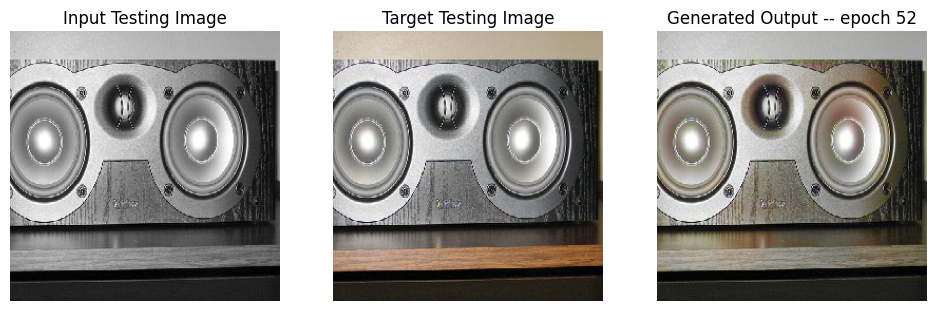

SSIM Score: 0.9494833946228027
PSNR Score: 27.271591186523438
Epoch 52
Training Details
Generator-- total_loss:7.48452 gan_loss:0.03806 l1_loss:0.04157 perceptual_loss:0.00808 Discriminator-- total_loss:6.56729 real_loss:6.56725 generated_loss:0.00004 --- SSIM 0.91380 PSNR 23.23665 LPIPS 0.00000
Time taken for epoch 53 is 545.6711914539337 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.25249 gan_loss:0.00016 l1_loss:0.04578  perceptual_loss:0.00923 Discriminator-- total_loss:11.26159 real_loss:11.26138 generated_loss:0.00021 --- SSIM 0.91144 PSNR 23.09364 LPIPS 0.00000
Time taken for epoch 53 is 586.6950824260712 sec
Number of iteration 63
Epoch 53
Training Details
Generator-- total_loss:7.59302 gan_loss:0.03661 l1_loss:0.04226 perceptual_loss:0.00812 Discriminator-- total_loss:6.71910 real_loss:6.71908 generated_loss:0.00003 --- SSIM 0.91155 PSNR 23.16214 LPIPS 0.00000
Time taken for epoch 54 is 542.0383293628693 sec
Number of iteration 500
Validation Details


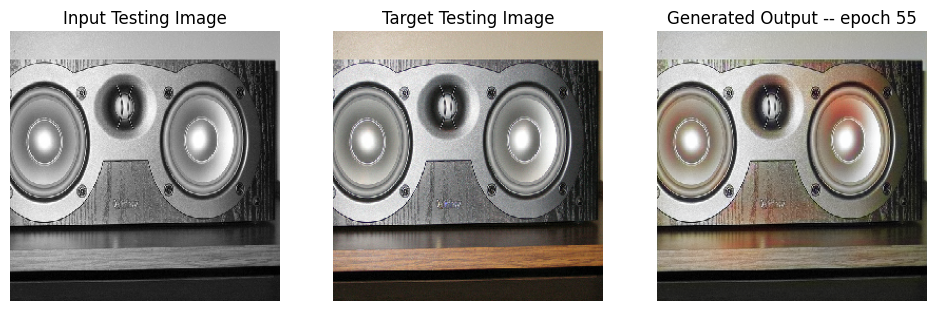

SSIM Score: 0.9450352787971497
PSNR Score: 26.16889190673828
Epoch 55
Training Details
Generator-- total_loss:7.50057 gan_loss:0.03554 l1_loss:0.04169 perceptual_loss:0.00807 Discriminator-- total_loss:6.37708 real_loss:6.37704 generated_loss:0.00004 --- SSIM 0.91285 PSNR 23.24966 LPIPS 0.00000
Time taken for epoch 56 is 541.8478405475616 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.84398 gan_loss:0.00017 l1_loss:0.04954  perceptual_loss:0.00942 Discriminator-- total_loss:12.45640 real_loss:12.45620 generated_loss:0.00020 --- SSIM 0.90253 PSNR 22.19515 LPIPS 0.00000
Time taken for epoch 56 is 583.2772300243378 sec
Number of iteration 63
Epoch 56
Training Details
Generator-- total_loss:7.52898 gan_loss:0.03316 l1_loss:0.04191 perceptual_loss:0.00806 Discriminator-- total_loss:6.44475 real_loss:6.44440 generated_loss:0.00035 --- SSIM 0.91272 PSNR 23.26685 LPIPS 0.00000
Time taken for epoch 57 is 545.045663356781 sec
Number of iteration 500
Validation Details
Ge

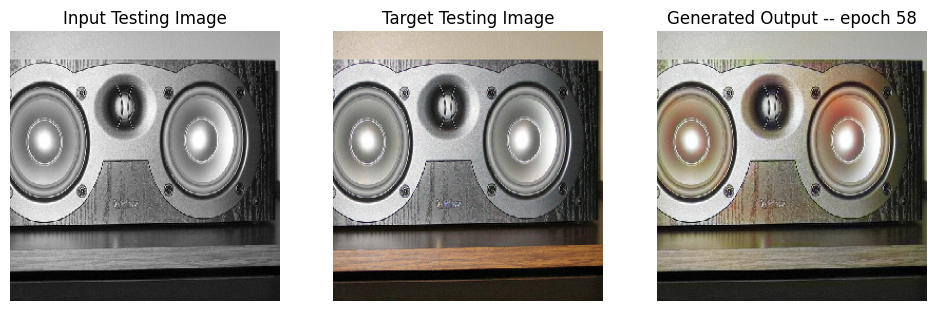

SSIM Score: 0.9444387555122375
PSNR Score: 25.743186950683594
Epoch 58
Training Details
Generator-- total_loss:7.57646 gan_loss:0.03517 l1_loss:0.04217 perceptual_loss:0.00811 Discriminator-- total_loss:6.44946 real_loss:6.44942 generated_loss:0.00004 --- SSIM 0.91274 PSNR 23.20258 LPIPS 0.00000
Time taken for epoch 59 is 541.0486993789673 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.16319 gan_loss:0.00016 l1_loss:0.04501  perceptual_loss:0.00941 Discriminator-- total_loss:10.97424 real_loss:10.97405 generated_loss:0.00019 --- SSIM 0.91542 PSNR 23.26153 LPIPS 0.00000
Time taken for epoch 59 is 582.236085653305 sec
Number of iteration 63
Epoch 59
Training Details
Generator-- total_loss:7.50293 gan_loss:0.03141 l1_loss:0.04167 perceptual_loss:0.00814 Discriminator-- total_loss:6.40458 real_loss:6.40455 generated_loss:0.00003 --- SSIM 0.91368 PSNR 23.31188 LPIPS 0.00000
Time taken for epoch 60 is 545.8302540779114 sec
Number of iteration 500
Validation Details
G

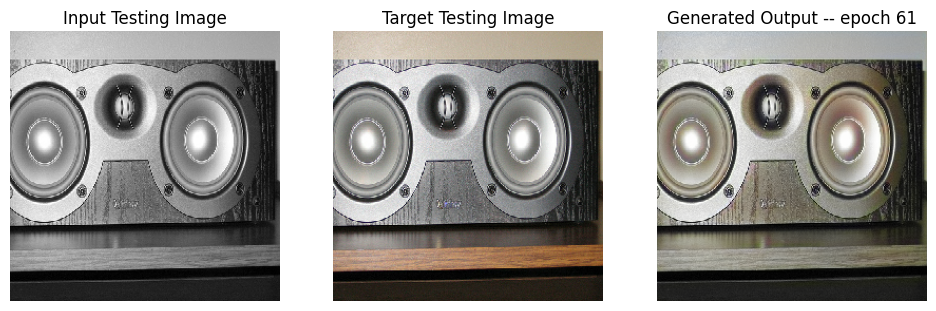

SSIM Score: 0.9499204754829407
PSNR Score: 26.953704833984375
Reduced discriminator learning rate to 9.000000427477062e-05 at epoch 61.
Epoch 61
Training Details
Generator-- total_loss:15.64319 gan_loss:8.25713 l1_loss:0.04121 perceptual_loss:0.00803 Discriminator-- total_loss:0.02833 real_loss:0.01445 generated_loss:0.01388 --- SSIM 0.91468 PSNR 23.35142 LPIPS 0.00000
Time taken for epoch 62 is 406.65256929397583 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.65909 gan_loss:0.38451 l1_loss:0.04597  perceptual_loss:0.00919 Discriminator-- total_loss:2.53298 real_loss:2.34007 generated_loss:0.19291 --- SSIM 0.91220 PSNR 22.94192 LPIPS 0.00000
Time taken for epoch 62 is 448.17553901672363 sec
Number of iteration 63
Epoch 62
Training Details
Generator-- total_loss:16.75138 gan_loss:9.37538 l1_loss:0.04112 perceptual_loss:0.00806 Discriminator-- total_loss:0.00796 real_loss:0.00423 generated_loss:0.00373 --- SSIM 0.91369 PSNR 23.36324 LPIPS 0.00000
Time taken for e

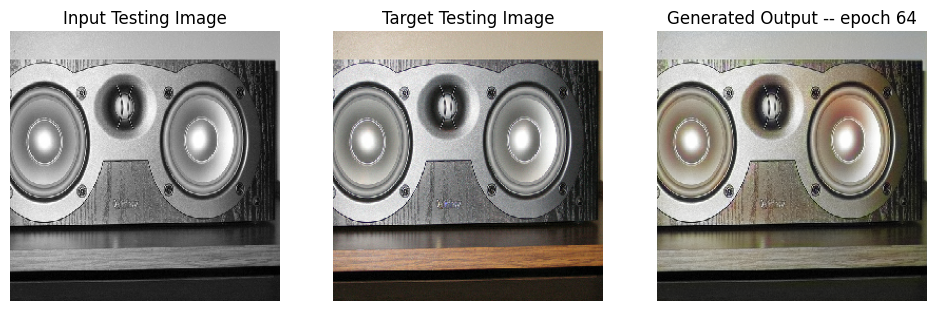

SSIM Score: 0.9484350085258484
PSNR Score: 26.585590362548828
Epoch 64
Training Details
Generator-- total_loss:18.22345 gan_loss:10.77167 l1_loss:0.04163 perceptual_loss:0.00805 Discriminator-- total_loss:0.00481 real_loss:0.00227 generated_loss:0.00254 --- SSIM 0.91301 PSNR 23.30363 LPIPS 0.00000
Time taken for epoch 65 is 405.8387508392334 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.26312 gan_loss:0.43882 l1_loss:0.04330  perceptual_loss:0.00886 Discriminator-- total_loss:2.47355 real_loss:2.24833 generated_loss:0.22523 --- SSIM 0.91708 PSNR 23.38806 LPIPS 0.00000
Time taken for epoch 65 is 446.6686453819275 sec
Number of iteration 63
Epoch 65
Training Details
Generator-- total_loss:19.24173 gan_loss:11.83868 l1_loss:0.04139 perceptual_loss:0.00796 Discriminator-- total_loss:0.00531 real_loss:0.00285 generated_loss:0.00246 --- SSIM 0.91403 PSNR 23.36085 LPIPS 0.00000
Time taken for epoch 66 is 406.6709039211273 sec
Number of iteration 500
Validation Detail

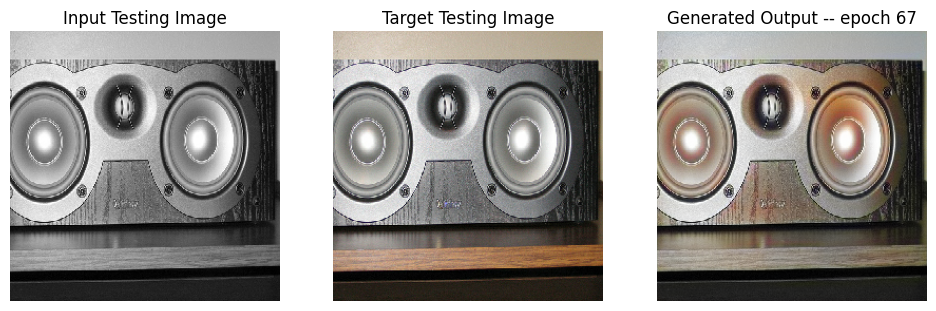

SSIM Score: 0.9431512355804443
PSNR Score: 25.43518829345703
Epoch 67
Training Details
Generator-- total_loss:7.80212 gan_loss:0.05253 l1_loss:0.04352 perceptual_loss:0.00814 Discriminator-- total_loss:7.21377 real_loss:7.21194 generated_loss:0.00183 --- SSIM 0.90771 PSNR 22.95183 LPIPS 0.00000
Time taken for epoch 68 is 544.9609155654907 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.23905 gan_loss:0.00025 l1_loss:0.04588  perceptual_loss:0.00904 Discriminator-- total_loss:12.66191 real_loss:12.66167 generated_loss:0.00025 --- SSIM 0.90859 PSNR 23.02480 LPIPS 0.00000
Time taken for epoch 68 is 585.7598218917847 sec
Number of iteration 63
Epoch 68
Training Details
Generator-- total_loss:7.78688 gan_loss:0.05030 l1_loss:0.04346 perceptual_loss:0.00812 Discriminator-- total_loss:7.25927 real_loss:7.25391 generated_loss:0.00536 --- SSIM 0.90814 PSNR 22.99592 LPIPS 0.00000
Time taken for epoch 69 is 554.332079410553 sec
Number of iteration 500
Validation Details
Ge

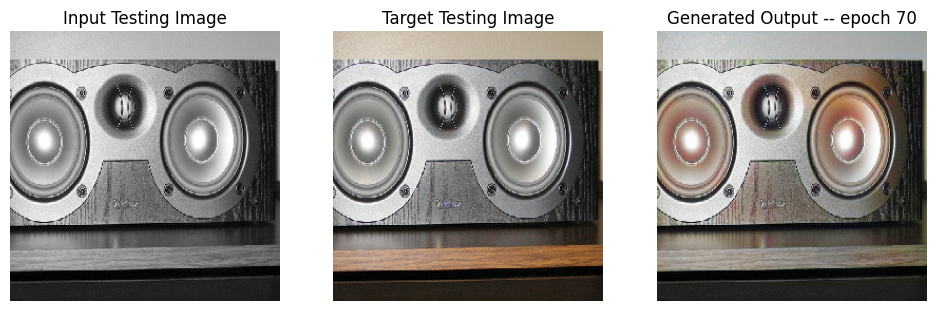

SSIM Score: 0.9454312324523926
PSNR Score: 25.97203254699707
Epoch 70
Training Details
Generator-- total_loss:7.75913 gan_loss:0.04491 l1_loss:0.04335 perceptual_loss:0.00808 Discriminator-- total_loss:6.92259 real_loss:6.92170 generated_loss:0.00089 --- SSIM 0.90866 PSNR 23.00201 LPIPS 0.00000
Time taken for epoch 71 is 543.9486584663391 sec
Number of iteration 500
Validation Details
Generator-- total_loss:8.21851 gan_loss:0.00021 l1_loss:0.04586  perceptual_loss:0.00893 Discriminator-- total_loss:12.97255 real_loss:12.97237 generated_loss:0.00018 --- SSIM 0.90859 PSNR 22.92468 LPIPS 0.00000
Time taken for epoch 71 is 584.8293817043304 sec
Number of iteration 63
Epoch 71
Training Details
Generator-- total_loss:7.74133 gan_loss:0.04666 l1_loss:0.04324 perceptual_loss:0.00806 Discriminator-- total_loss:6.87458 real_loss:6.87376 generated_loss:0.00082 --- SSIM 0.90839 PSNR 23.02853 LPIPS 0.00000
Time taken for epoch 72 is 546.2822821140289 sec
Number of iteration 500
Validation Details
G

In [50]:
fit(train_dataset, epochs, val, gen)

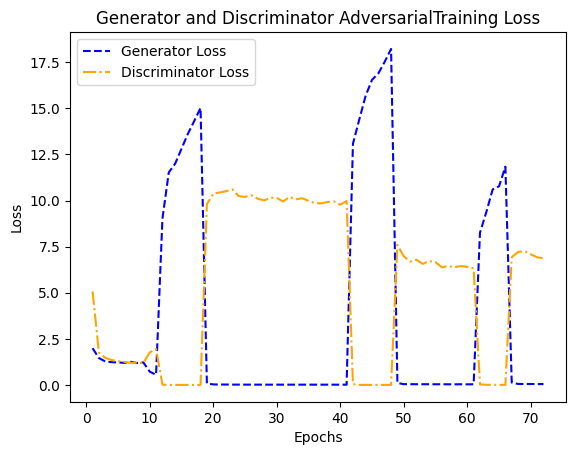

In [51]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, train_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator AdversarialTraining Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/train_loss_plot_1.png')
plt.show()

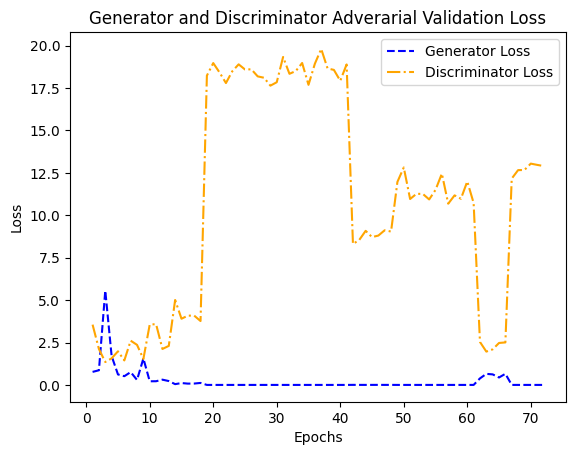

In [52]:
epochs = range(1, len(test_generator_losses) + 1)

plt.plot(epochs, test_generator_gan_losses, '--b', label='Generator Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Discriminator Loss')
plt.title('Generator and Discriminator Adverarial Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/test_loss_plot_1.png')
plt.show()

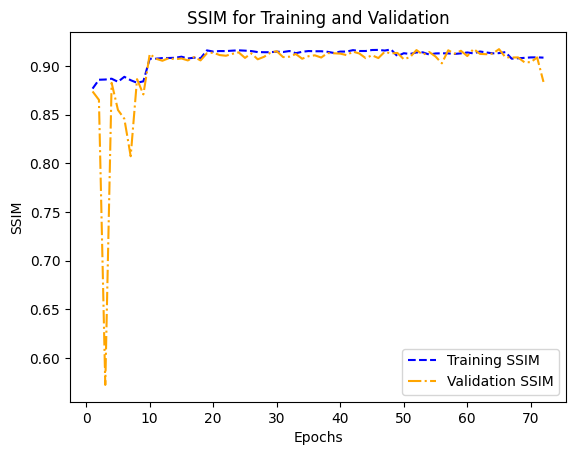

In [53]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_ssim, '--b', label='Training SSIM')
plt.plot(epochs, testing_ssim, '-.', color='orange', label='Validation SSIM')
plt.title('SSIM for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('SSIM')
plt.legend()
plt.savefig('/kaggle/working/SSIM_plot_1.png')
plt.show()

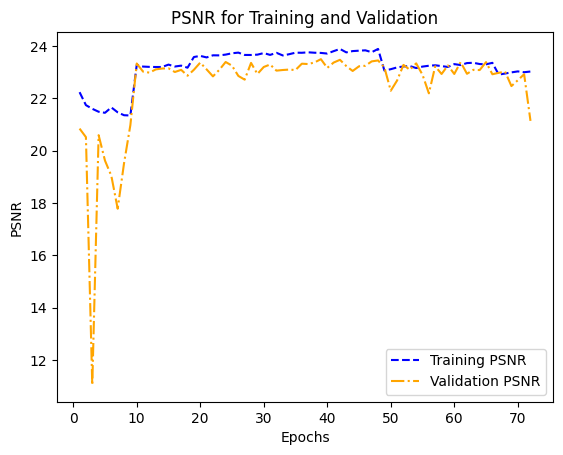

In [54]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_psnr, '--b', label='Training PSNR')
plt.plot(epochs, testing_psnr, '-.', color='orange', label='Validation PSNR')
plt.title('PSNR for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('PSNR')
plt.legend()
plt.savefig('/kaggle/working/PSNR_plot_1.png')
plt.show()

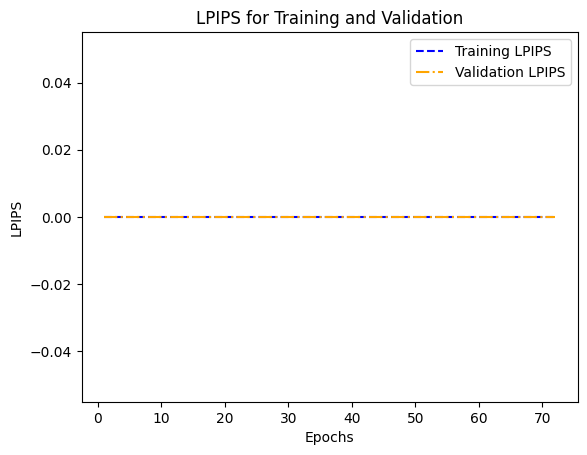

In [55]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, training_lpips, '--b', label='Training LPIPS')
plt.plot(epochs, testing_lpips, '-.', color='orange', label='Validation LPIPS')
plt.title('LPIPS for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('LPIPS')
plt.legend()
plt.savefig('/kaggle/working/LPIPS_plot_1.png')
plt.show()

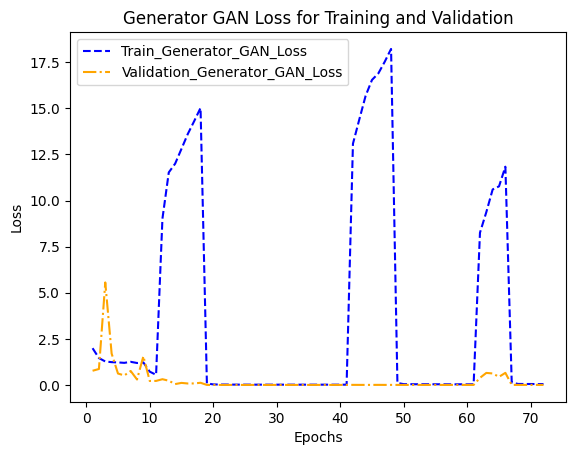

In [56]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_gan_losses, '--b', label='Train_Generator_GAN_Loss')
plt.plot(epochs, test_generator_gan_losses,'-.', color='orange', label='Validation_Generator_GAN_Loss')
plt.title('Generator GAN Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_GAN_plot_1.png')
plt.show()

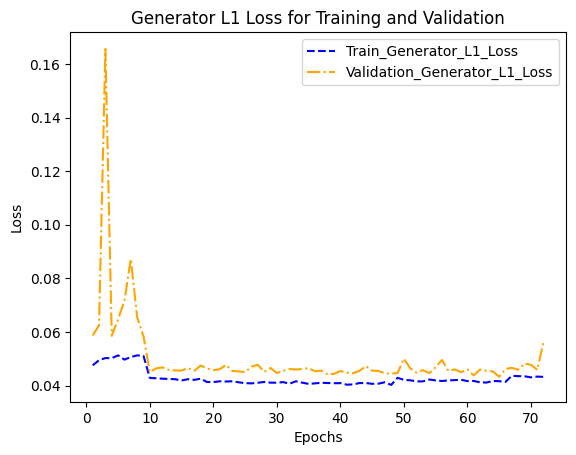

In [57]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_l1_losses, '--b', label='Train_Generator_L1_Loss')
plt.plot(epochs, test_generator_l1_losses, '-.', color='orange', label='Validation_Generator_L1_Loss')
plt.title('Generator L1 Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_L1_plot_1.png')
plt.show()

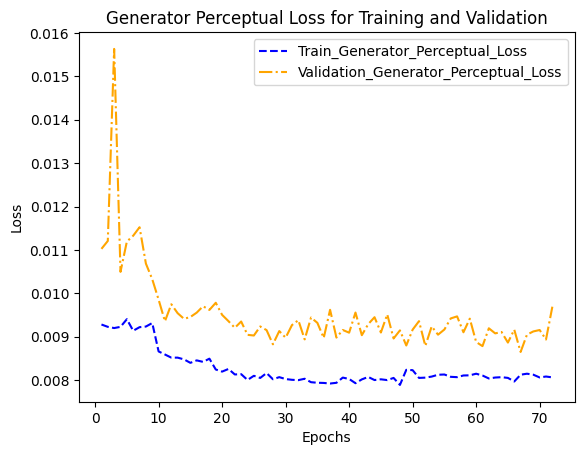

In [58]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_perceptual_losses, '--b', label='Train_Generator_Perceptual_Loss')
plt.plot(epochs, test_generator_perceptual_losses, '-.', color='orange', label='Validation_Generator_Perceptual_Loss')
plt.title('Generator Perceptual Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_Perceptual_plot_1.png')
plt.show()

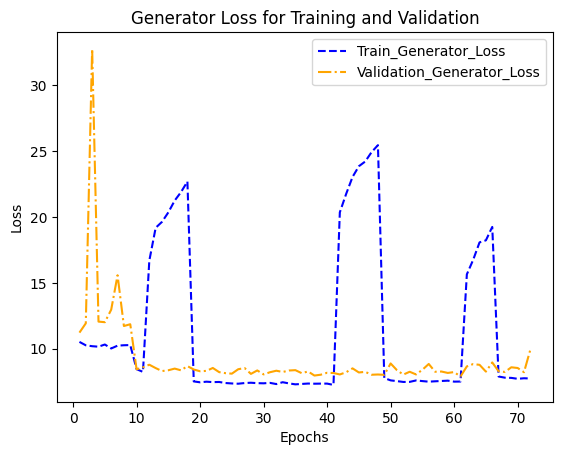

In [59]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_generator_losses, '--b', label='Train_Generator_Loss')
plt.plot(epochs, test_generator_losses, '-.', color='orange', label='Validation_Generator_Loss')
plt.title('Generator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Gen_plot_1.png')
plt.show()

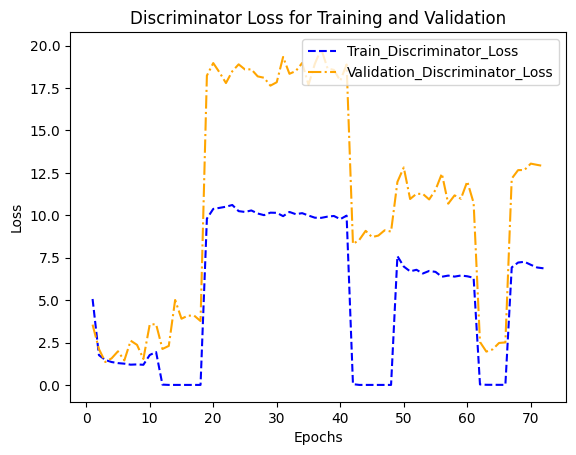

In [60]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_losses, '--b', label='Train_Discriminator_Loss')
plt.plot(epochs, test_discriminator_losses, '-.', color='orange', label='Validation_Discriminator_Loss')
plt.title('Discriminator Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_plot_1.png')
plt.show()

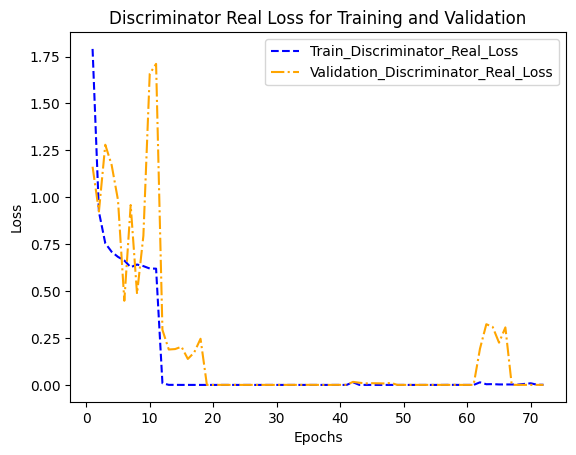

In [61]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_real_losses, '--b', label='Train_Discriminator_Real_Loss')
plt.plot(epochs, test_discriminator_real_losses, '-.', color='orange', label='Validation_Discriminator_Real_Loss')
plt.title('Discriminator Real Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Real_plot_1.png')
plt.show()

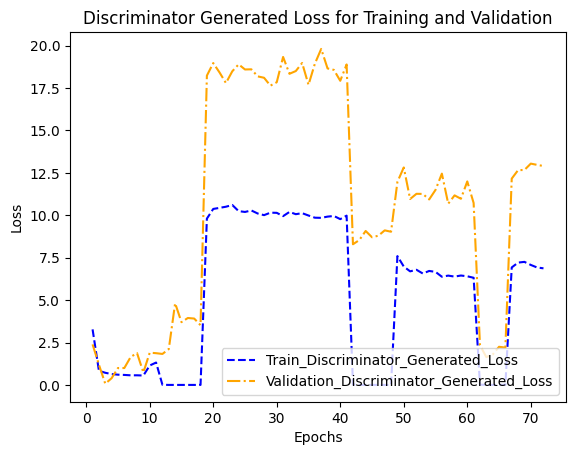

In [62]:
epochs = range(1, len(train_generator_losses) + 1)

plt.plot(epochs, train_discriminator_generated_losses, '--b', label='Train_Discriminator_Generated_Loss')
plt.plot(epochs, test_discriminator_generated_losses,'-.', color='orange', label='Validation_Discriminator_Generated_Loss')
plt.title('Discriminator Generated Loss for Training and Validation')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.savefig('/kaggle/working/Disc_Generated_plot_1.png')
plt.show()

In [63]:
import csv
with open('/kaggle/working/dataJan20.csv','w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(all_records)

In [64]:
# # Evaluation on testing data


# each_epoch_test_lpips = []
# each_epoch_test_psnr = []
# each_epoch_test_ssim = []
# each_epoch_test_fid = []
# each_epoch_test_generator_losses = []
# each_epoch_test_generator_gan_losses = []
# each_epoch_test_generator_l1_losses = []
# each_epoch_test_generator_l2_losses = []
# each_epoch_test_generator_perceptual_losses = []
# each_epoch_test_discriminator_losses = []
# each_epoch_test_discriminator_real_losses = []
# each_epoch_test_discriminator_generated_losses = []

# for n, (input_, target) in test_dataset.enumerate():
#     test_gen_loss, test_gen_gan_loss, test_gen_l1_loss, test_gen_perceptual_loss, test_disc_loss, test_disc_real_loss, test_disc_generated_loss, test_ssim, test_psnr, test_lpips, test_fid = test_step(input_, target)

#     each_epoch_test_generator_losses.append(test_gen_loss)
#     each_epoch_test_generator_gan_losses.append(test_gen_gan_loss)
#     each_epoch_test_generator_l1_losses.append(test_gen_l1_loss)
# #             each_epoch_test_generator_l2_losses.append(test_gen_l2_loss)
#     each_epoch_test_generator_perceptual_losses.append(test_gen_perceptual_loss)
#     each_epoch_test_discriminator_losses.append(test_disc_loss)
#     each_epoch_test_discriminator_real_losses.append(test_disc_real_loss)
#     each_epoch_test_discriminator_generated_losses.append(test_disc_generated_loss)
#     each_epoch_test_ssim.append(tf.reduce_mean(test_ssim.numpy()))
#     each_epoch_test_psnr.append(tf.reduce_mean(test_psnr.numpy()))
#     each_epoch_test_lpips.append(tf.reduce_mean(test_lpips.numpy()))
#     each_epoch_test_fid.append(test_fid)
#     print(test_fid)

# print("Testing Details")
# print("Generator-- total_loss:{:.5f} gan_loss:{:.5f} l1_loss:{:.5f}  perceptual_loss:{:.5f} \nDiscriminator-- total_loss:{:.5f} real_loss:{:.5f} generated_loss:{:.5f} --- \nSSIM {:.5f} \nPSNR {:.5f} \nLPIPS {:.5f} \nFID Score: {:.5f}".format(np.mean(each_epoch_test_generator_losses),np.mean(each_epoch_test_generator_gan_losses), np.mean(each_epoch_test_generator_l1_losses), np.mean(each_epoch_test_generator_perceptual_losses),np.mean(each_epoch_test_discriminator_losses), np.mean(each_epoch_test_discriminator_generated_losses), np.mean(each_epoch_test_discriminator_real_losses), np.mean(each_epoch_test_ssim), np.mean(each_epoch_test_psnr), np.mean(each_epoch_test_lpips), np.mean(each_epoch_test_fid)))

In [65]:
os.mkdir('/kaggle/working/modelsFeb7')

In [66]:
gen.save('/kaggle/working/modelsFeb7/gen.h5')
gen.save_weights('/kaggle/working/modelsFeb7/gen_weight.keras')
disc.save('/kaggle/working/modelsFeb7/disc.h5')
disc.save_weights('/kaggle/working/modelsFeb7/disc_wweight.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [67]:
def download_file(path, download_file_name):
    os.chdir('/kaggle/working/')
    zip_name = f"/kaggle/working/{download_file_name}.zip"
    command = f"zip {zip_name} {path} -r"
    result = subprocess.run(command, shell=True, capture_output=True, text=True)
    if result.returncode !=0:
        print("Unable to run zip command")
        print(result.stderr)
        return
    display(FileLink(f'{download_file_name}.zip'))

In [68]:
import subprocess
from IPython.display import FileLink, display

In [69]:
download_file('/kaggle/working', 'outputFeb10')

/kaggle/working/outputFeb10.zip